In [3]:
import pandas as pd
import glob
import os
import re

import re
import pandas as pd
import os
import pytz
import numpy as np
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm
import warnings
from concurrent.futures import ThreadPoolExecutor
import shutil

##### Date range correction
* Only dates after July 2023 will be taken

In [21]:
# Hourly average time shiftinhg
dir = "Data/Raw Clone"
subdirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d)) if "Home" in d]
# subdirs = ["Badda Home"]
for subdir in tqdm(subdirs, desc="Processing homes"):
    print('='*50)
    print(f"Processing {subdir}")
    merges = ['Indoor_merged.csv', 'Outdoor_merged.csv']
    for file in merges:
        filedir = os.path.join(dir, subdir, file)
        df = pd.read_csv(filedir, parse_dates=['UTCDateTime'])
        df["BDDateTime"] = df['UTCDateTime'] + pd.Timedelta(hours=6)
        df.to_csv(filedir, index=False)

Processing homes:   0%|          | 0/9 [00:00<?, ?it/s]

Processing Dhakeshwari Home
Processing Mohakhali Home
Processing Mohammadpur Home
Processing Ajimpur Home
Processing Badda Home
Processing Banasree Home
Processing Dania Home
Processing Khilgawn Home
Processing Nakhalpara Home


In [ ]:
dir = "Data/Raw Clone"

subdirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d)) if "Home" in d]
for subdir in tqdm(subdirs, desc="Processing homes"):
    print('='*50)
    print(f"Processing {subdir}")
    merges = ['Indoor_merged.csv', 'Outdoor_merged.csv']
    for file in merges:
        df = pd.read_csv(os.path.join(dir, subdir, file), parse_dates=['BDDateTime'])
        df = df[df['BDDateTime'] >= pd.to_datetime("2023-07-01", format = "%Y-%m-%d")]
        df = df[['BDDateTime','current_humidity','current_temp_f','current_dewpoint_f','pressure','pm2_5_cf_1','pm2_5_atm','pm2_5_cf_1_b','pm2_5_atm_b']].copy()
        cols = ['pm2_5_cf_1', 'pm2_5_atm', 'pm2_5_cf_1_b', 'pm2_5_atm_b']
        df[cols] = df[cols].where((df[cols] >= 5) & (df[cols] <= 500), float('nan'))
        df.to_csv(os.path.join(dir, subdir, file), index=False)

Processed Dhakeshwari Home


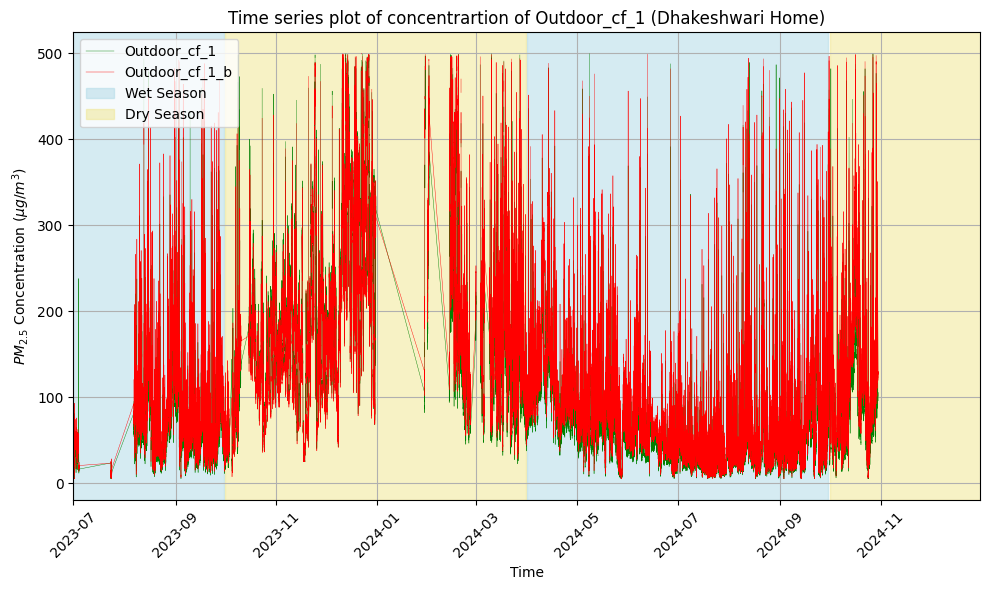

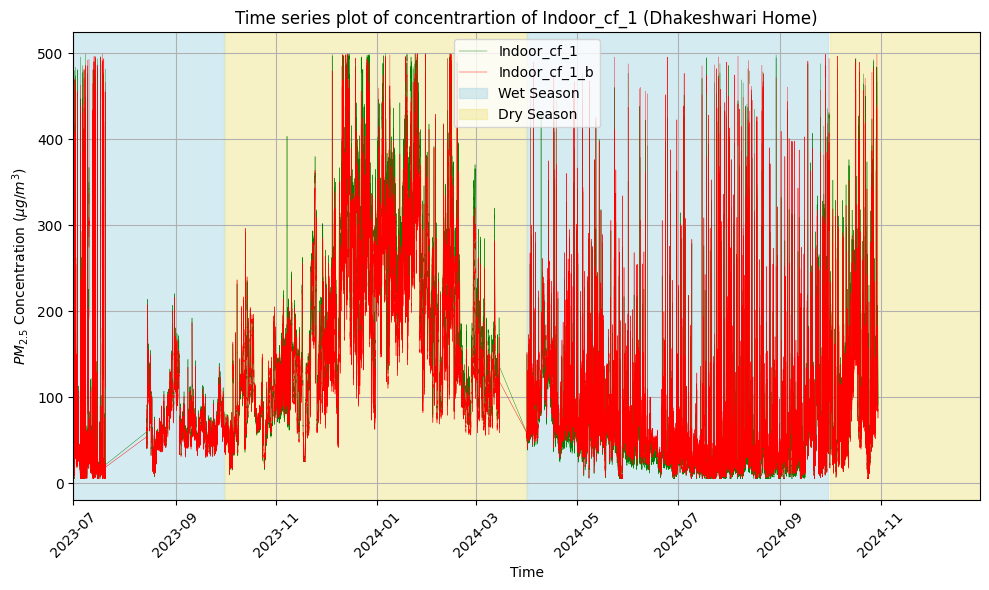

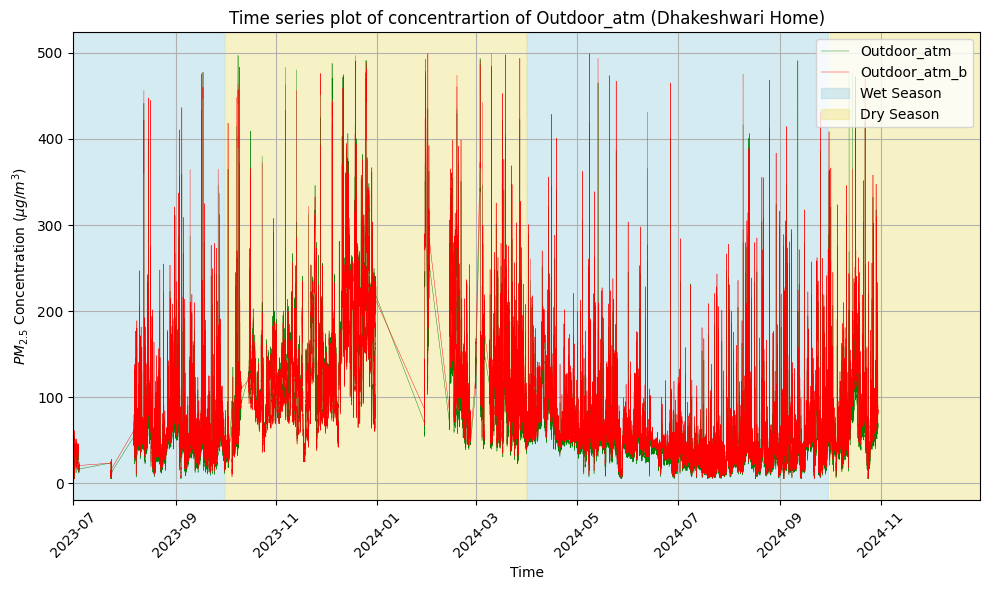

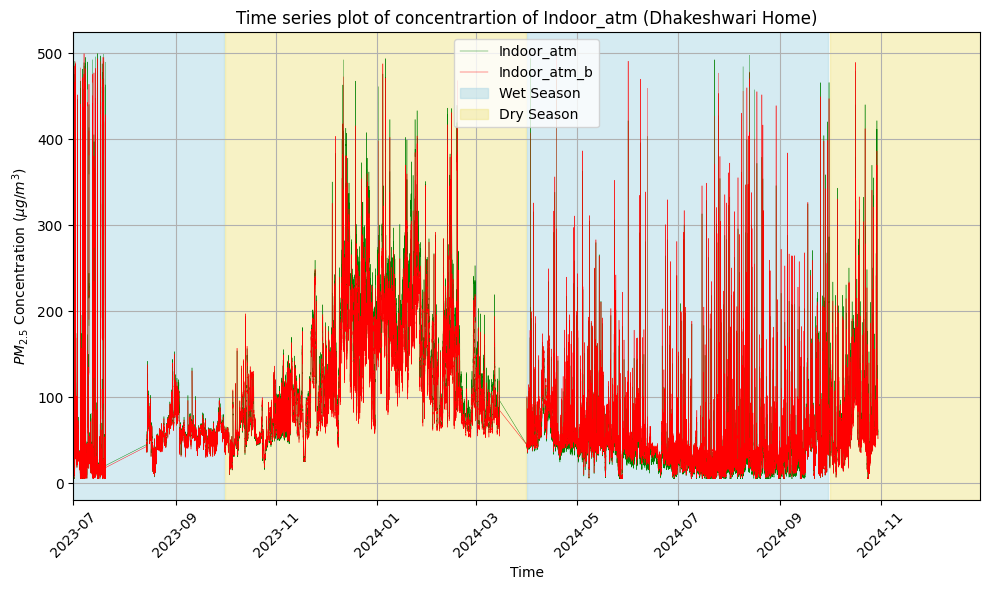

Processed Mohakhali Home


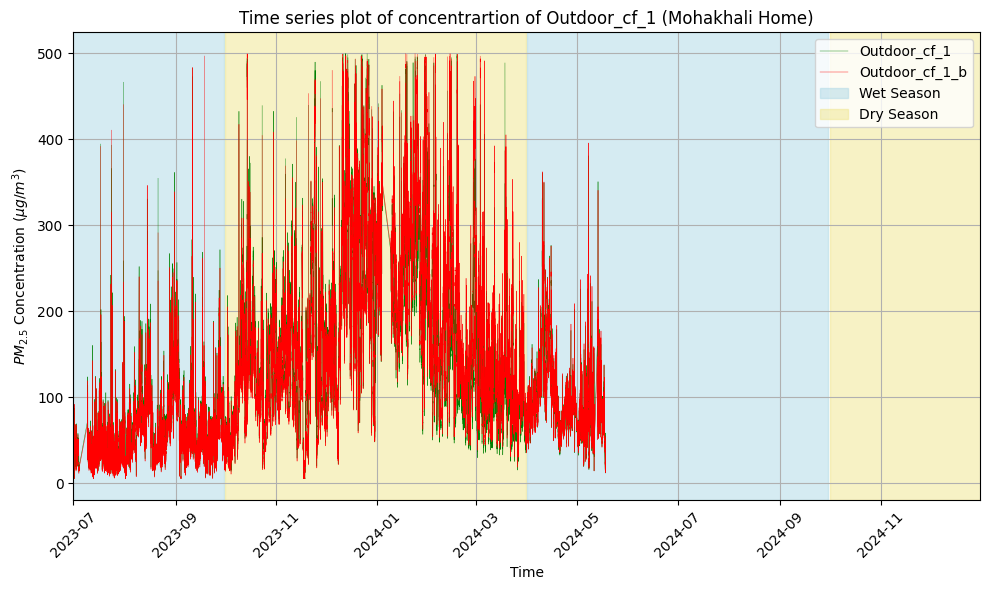

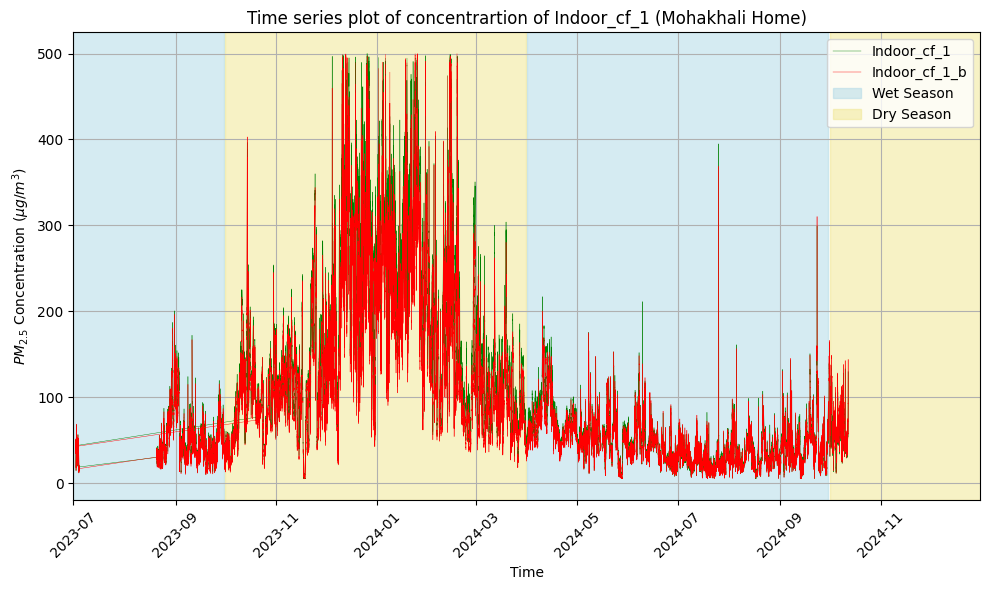

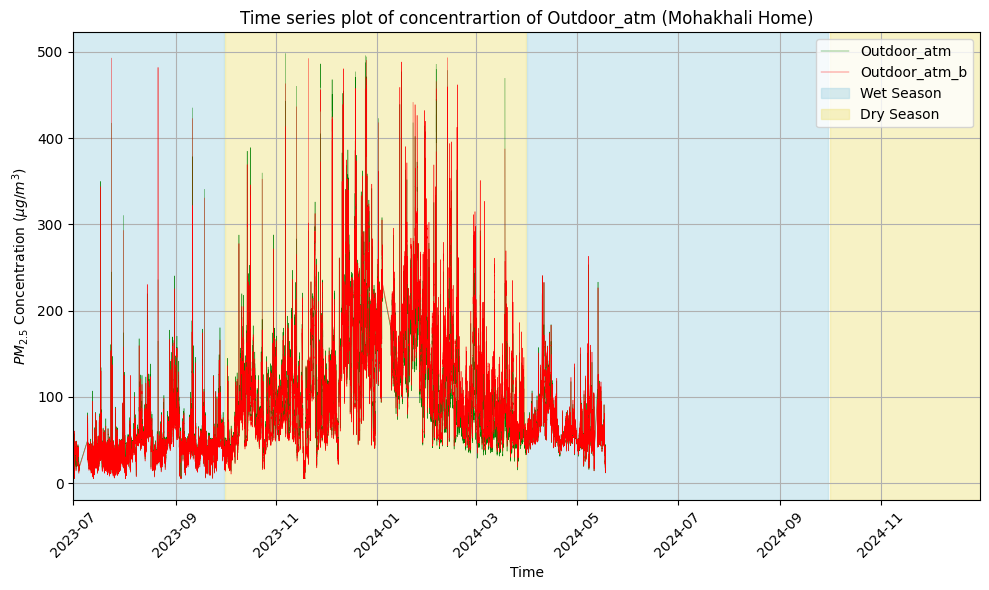

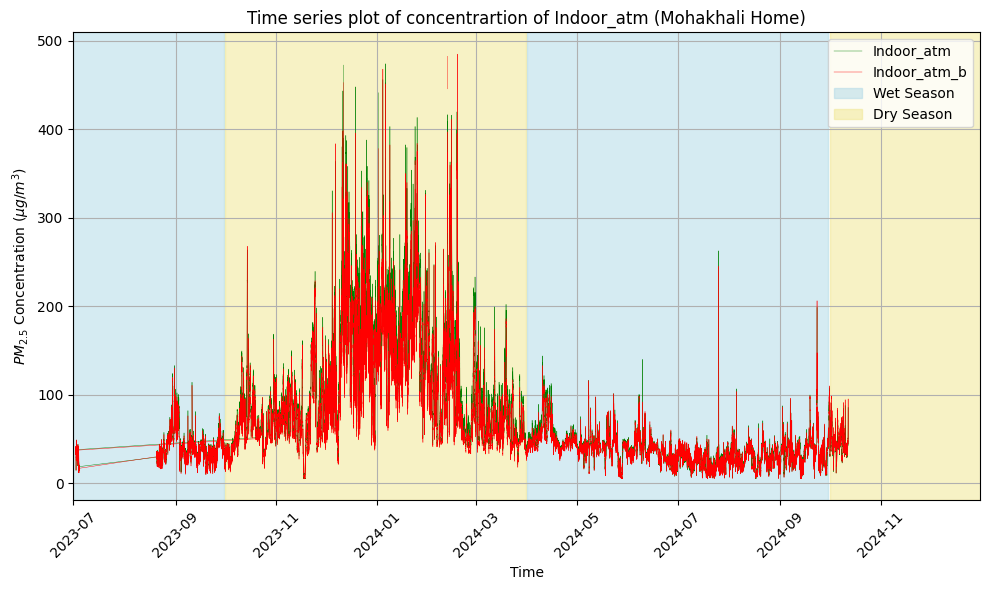

Processed Mohammadpur Home


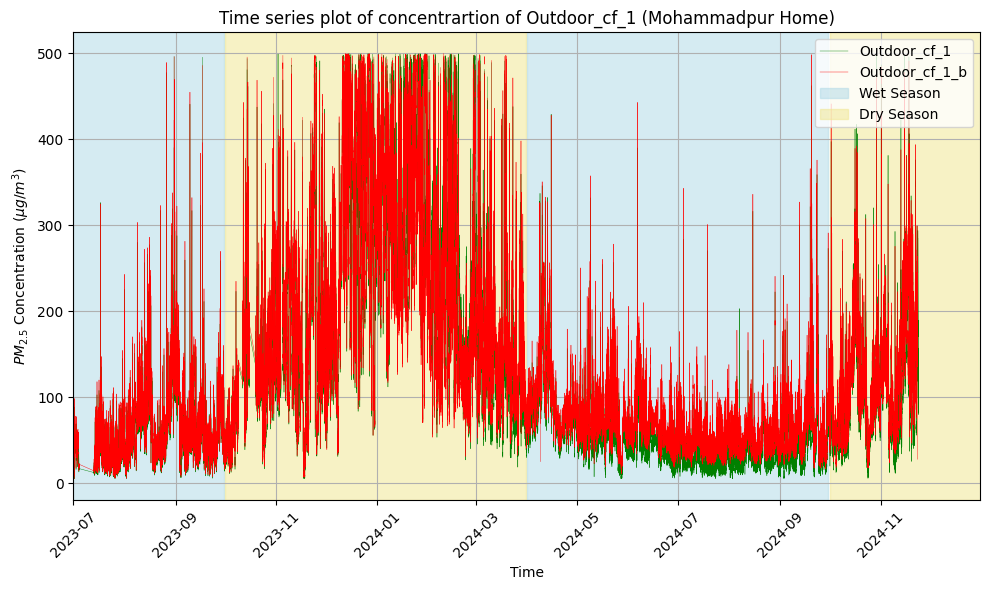

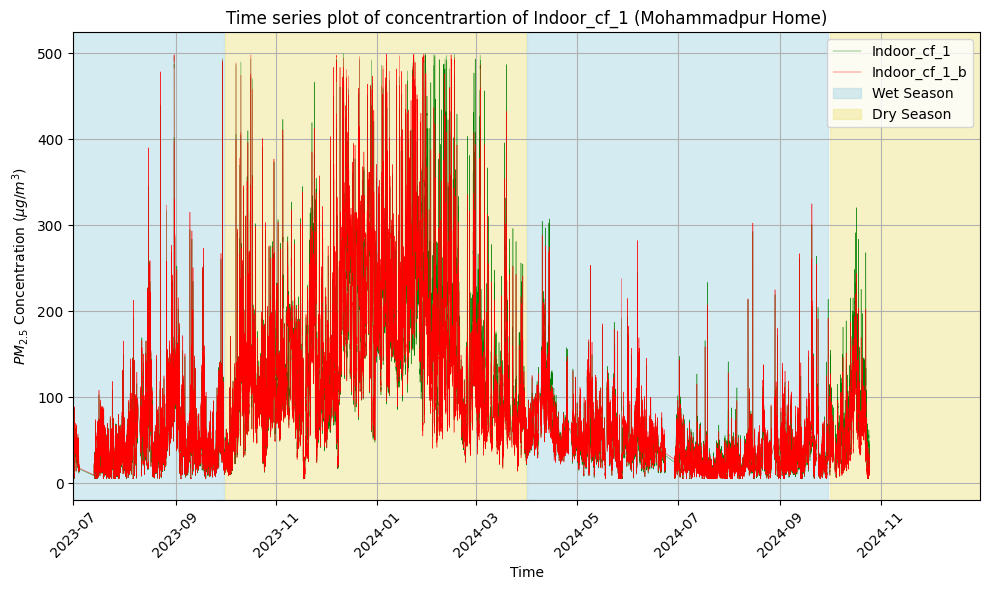

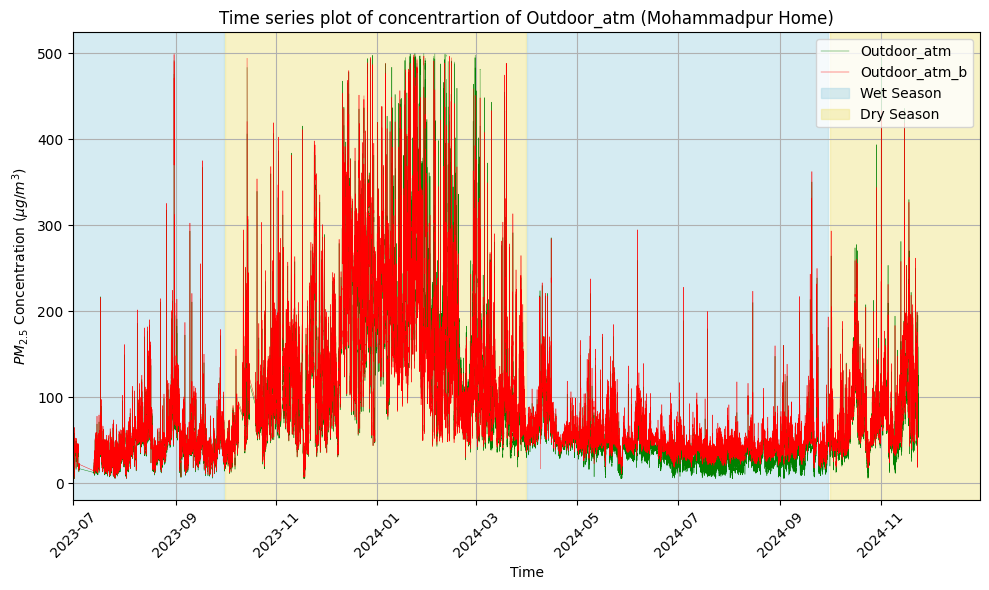

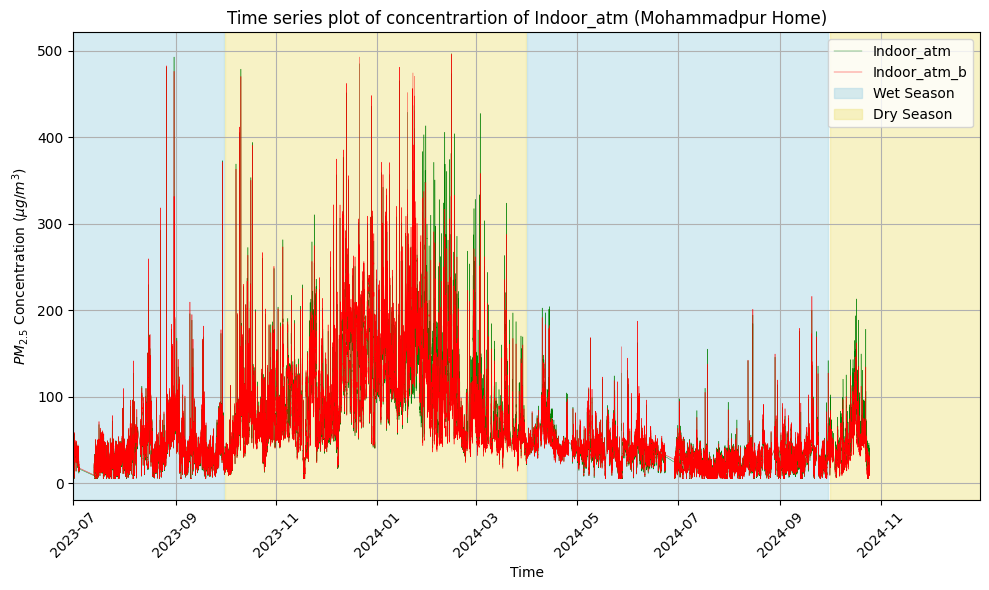

Processed Ajimpur Home


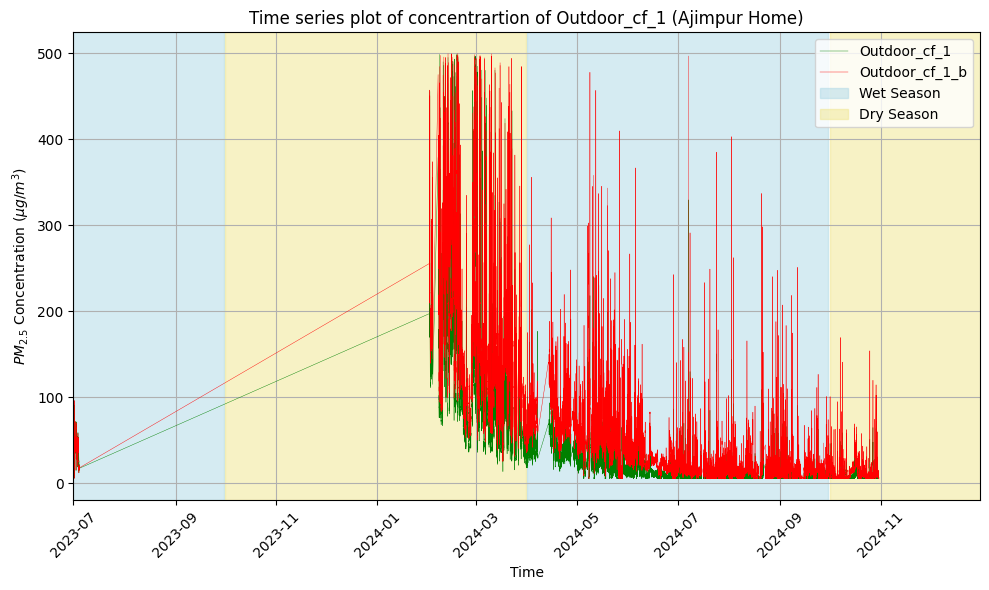

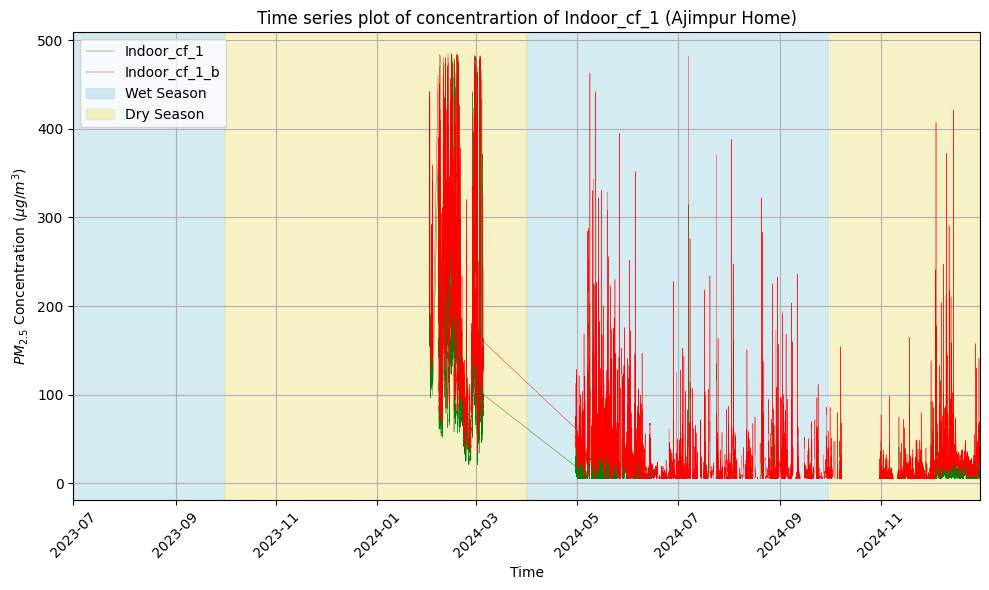

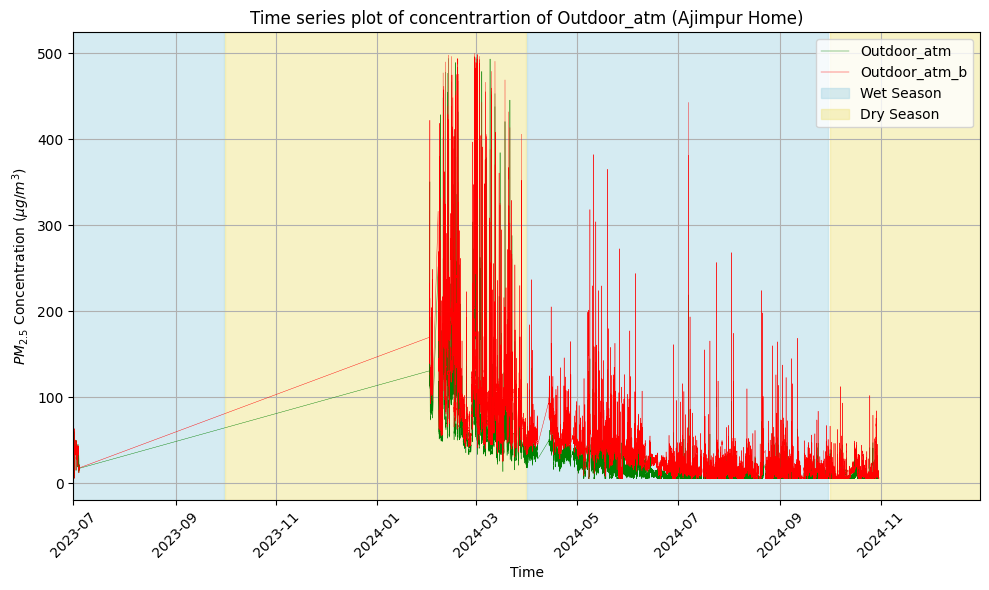

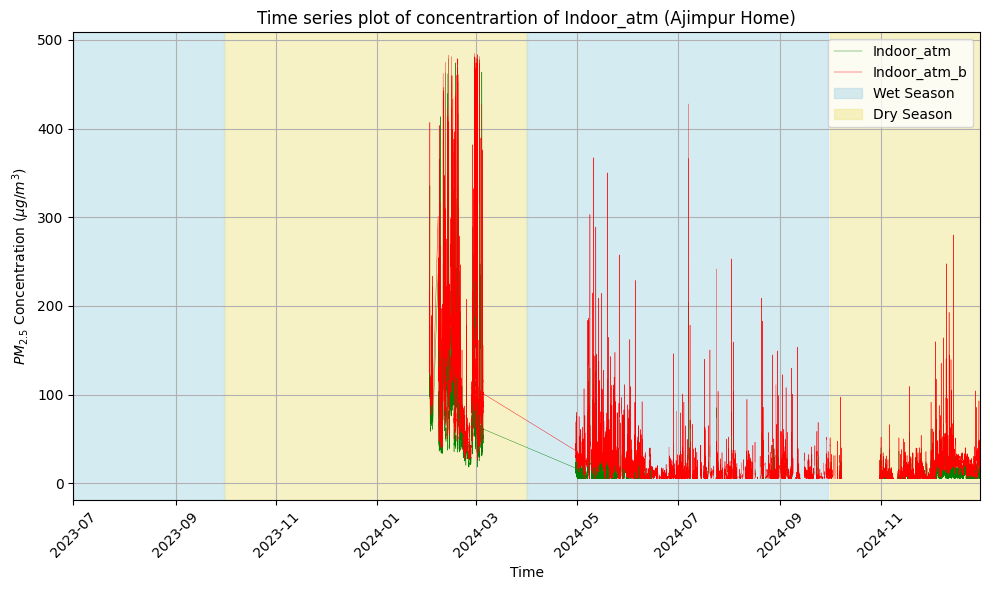

Processed Badda Home


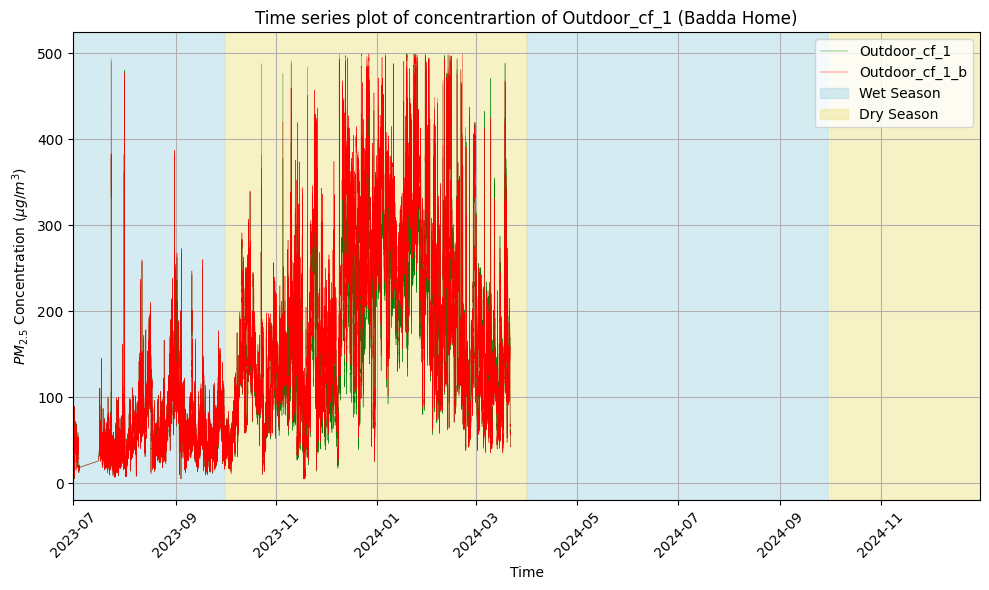

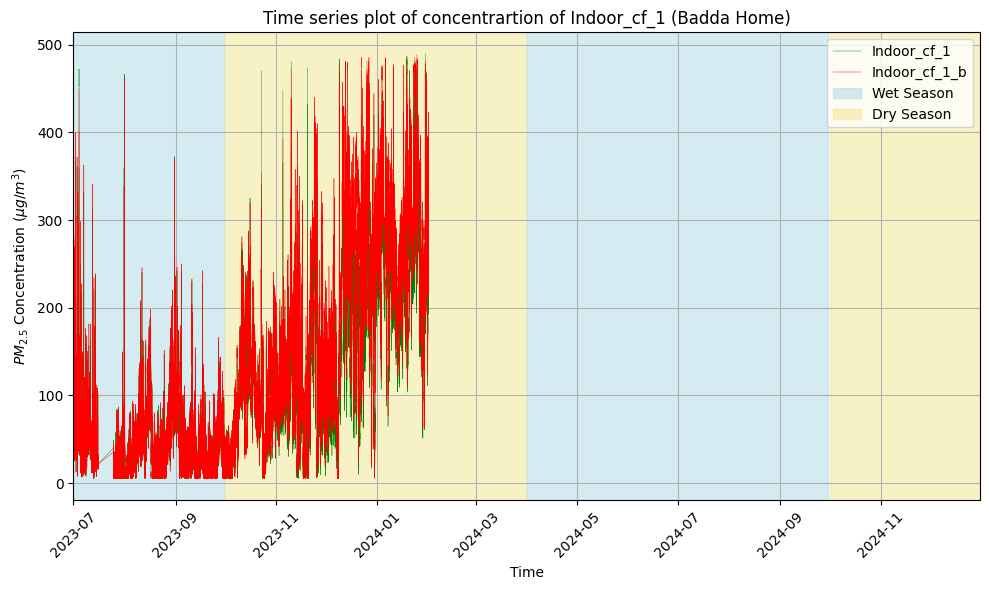

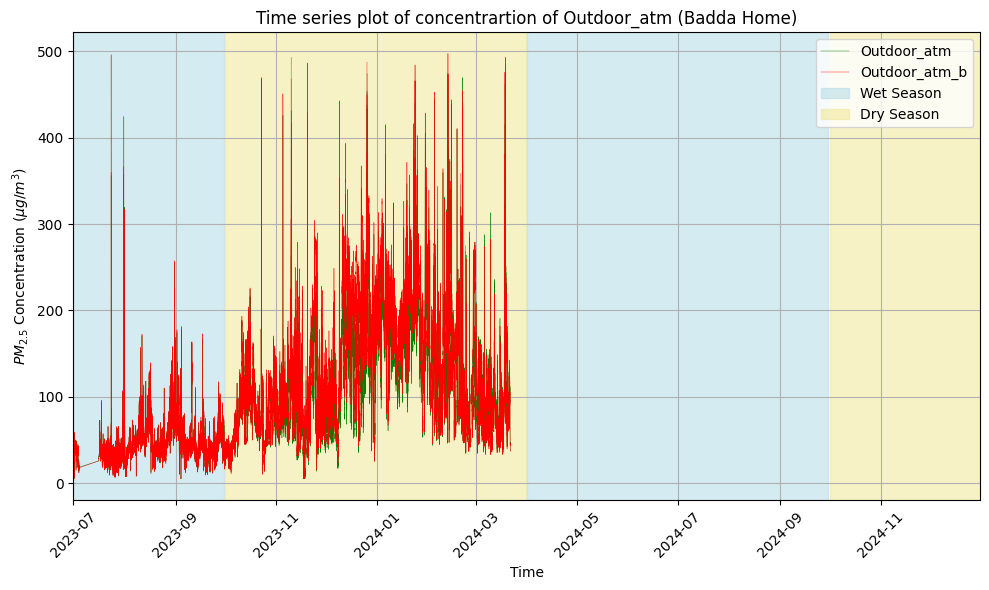

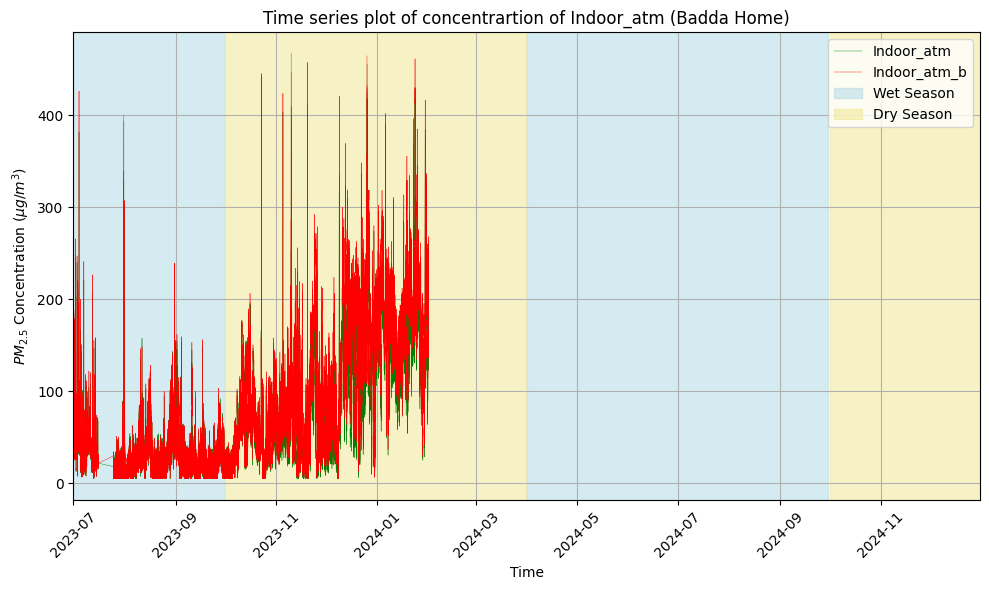

Processed Banasree Home


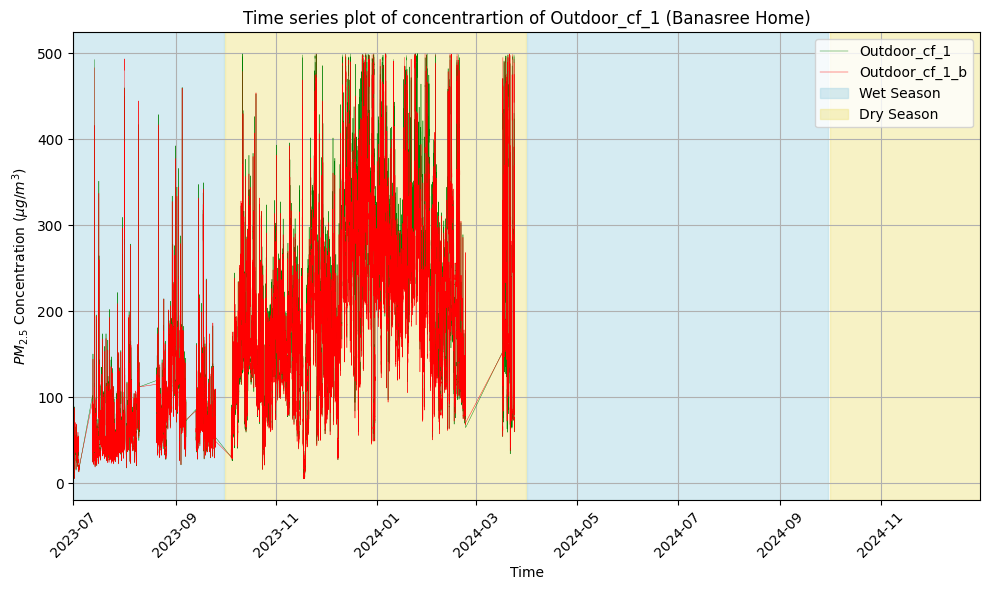

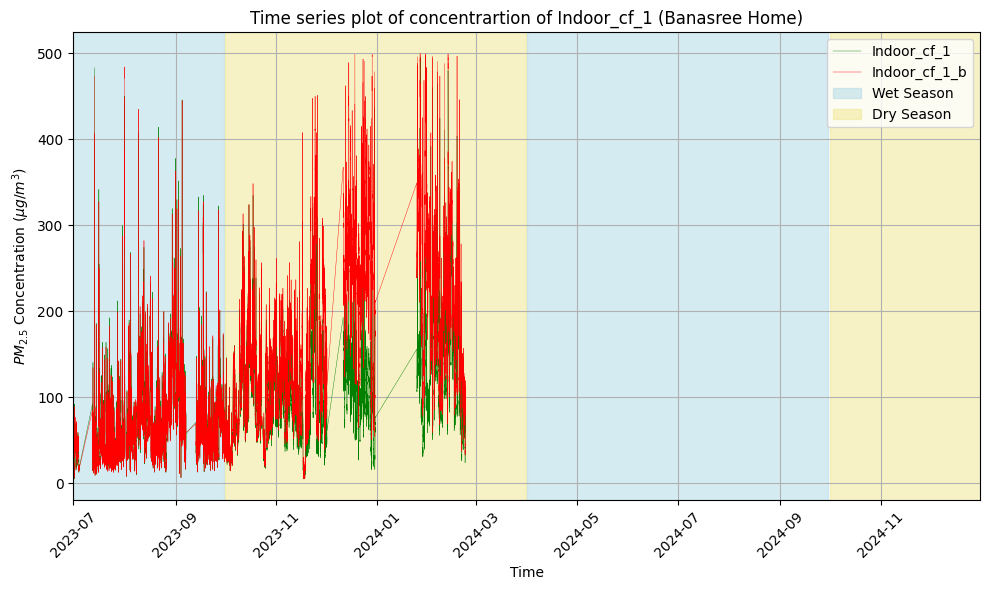

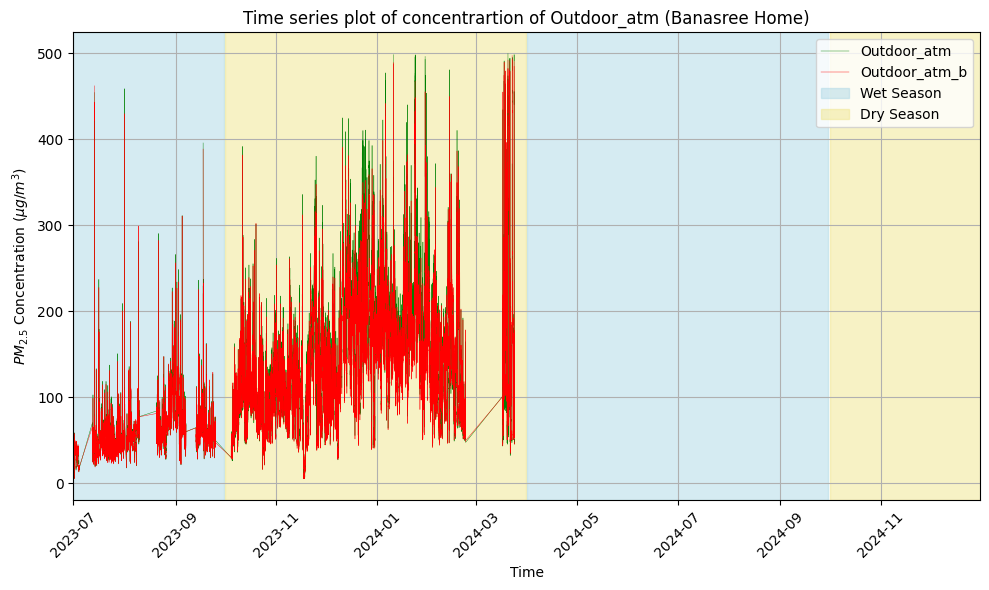

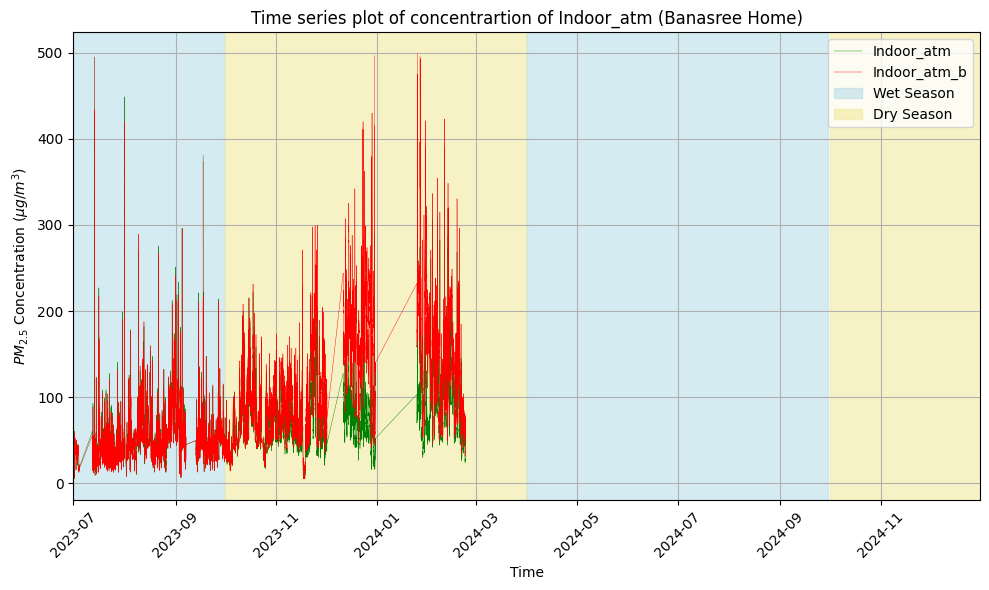

Processed Dania Home


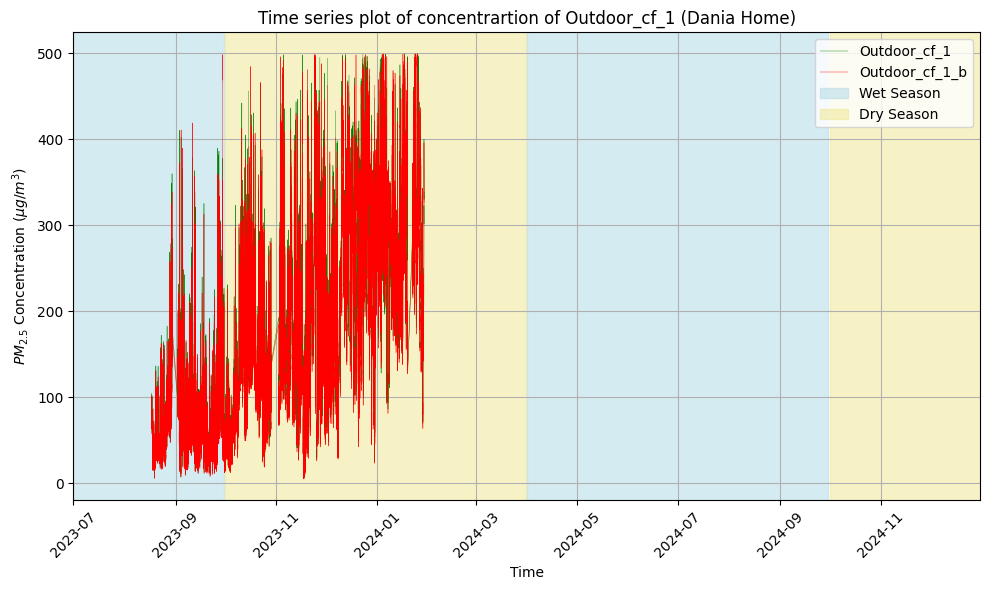

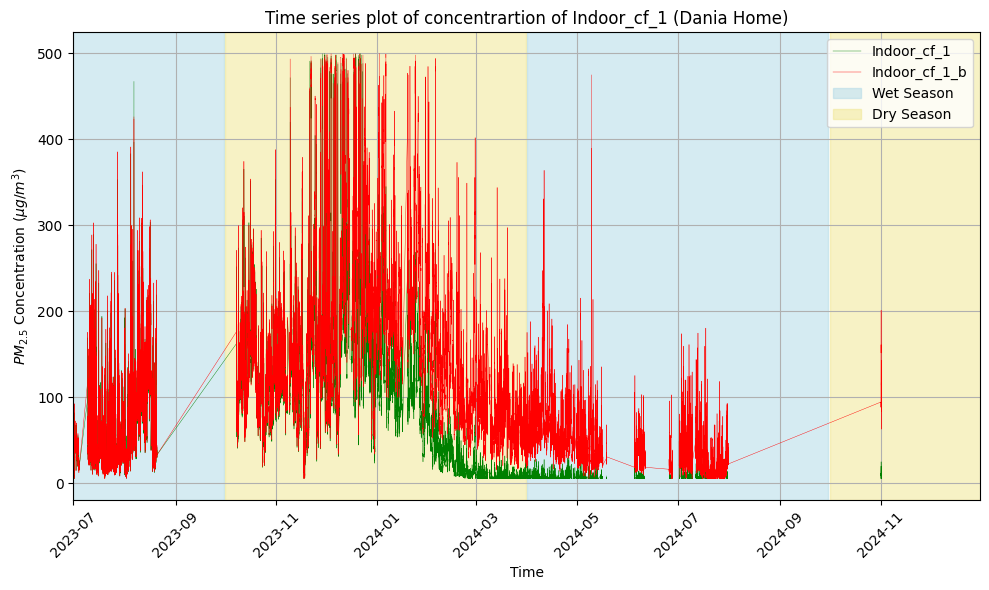

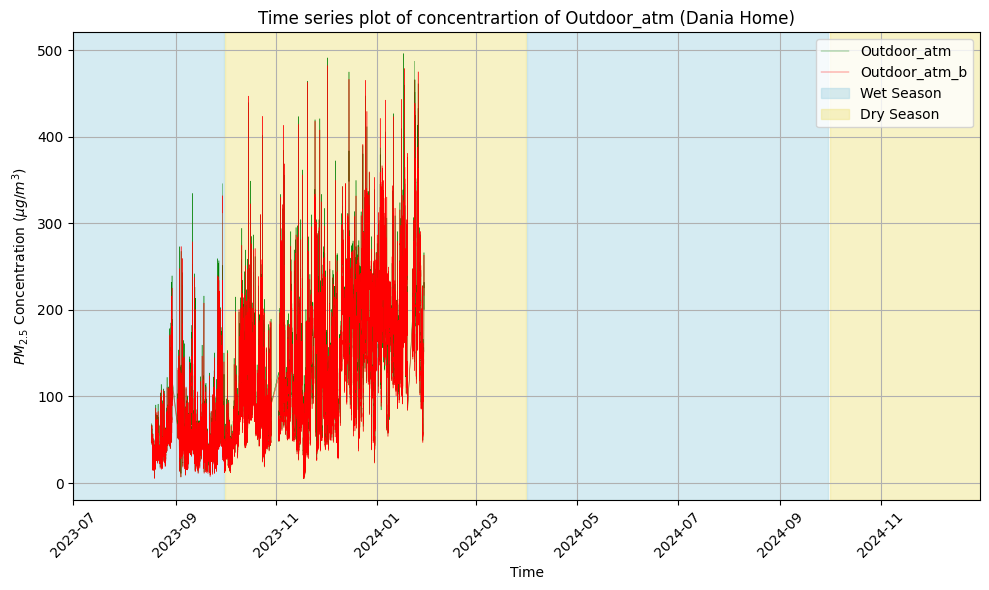

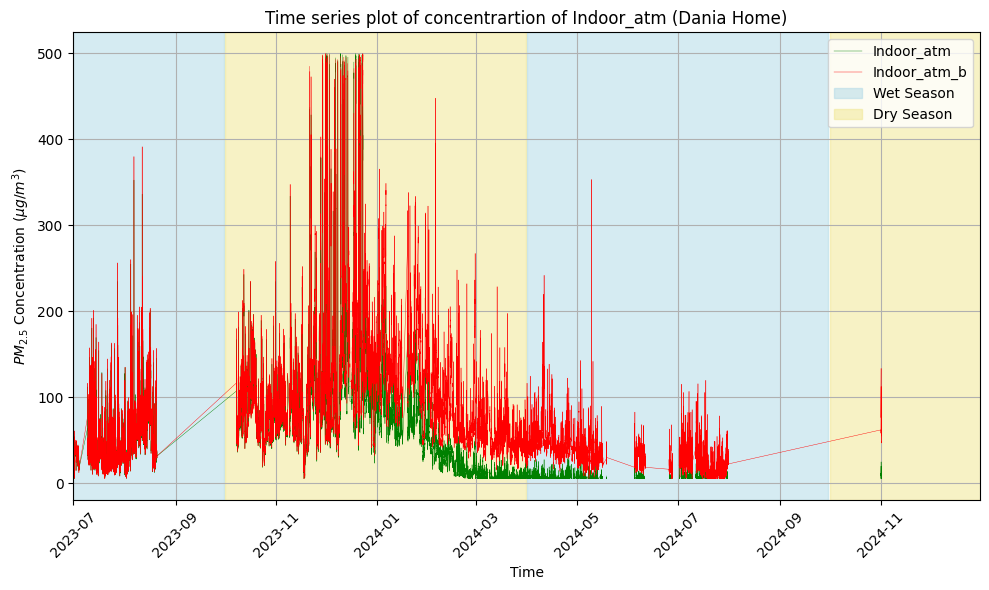

Processed Khilgawn Home


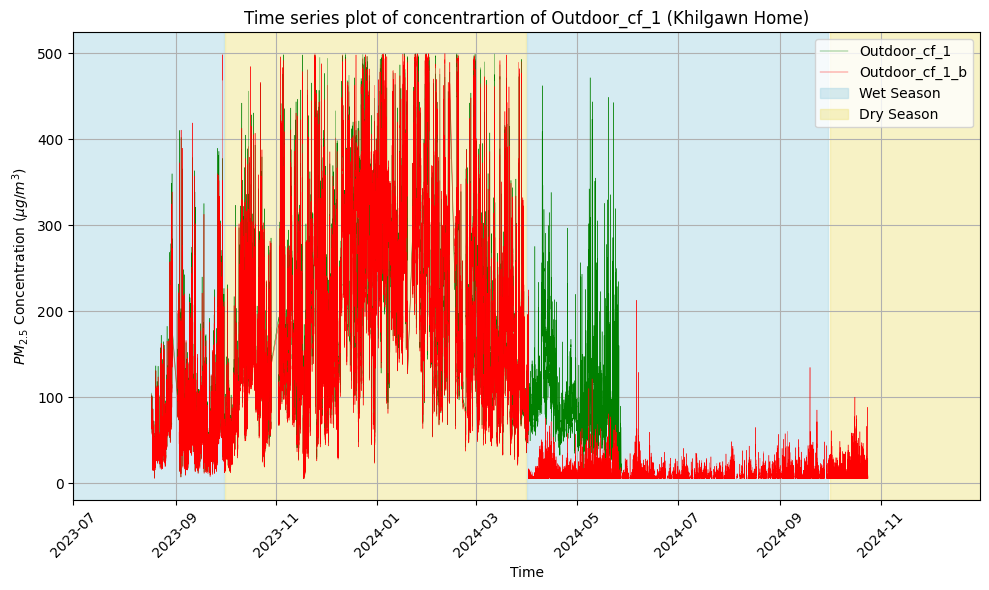

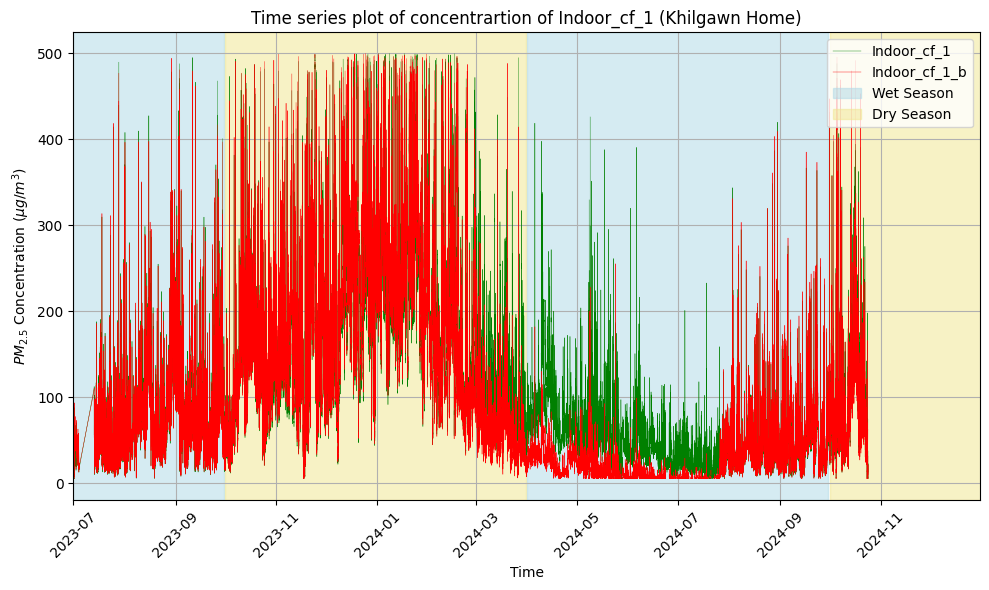

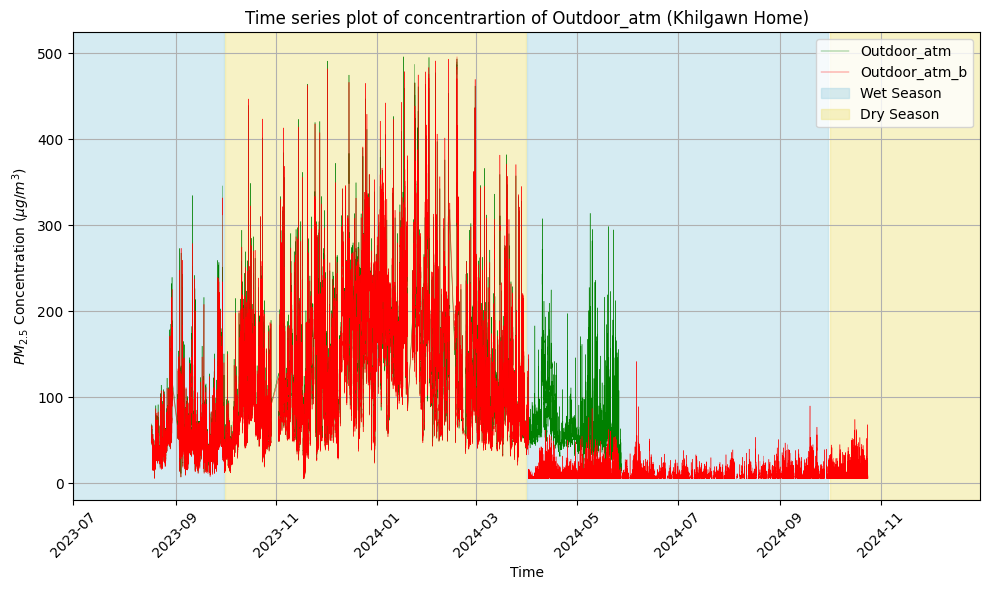

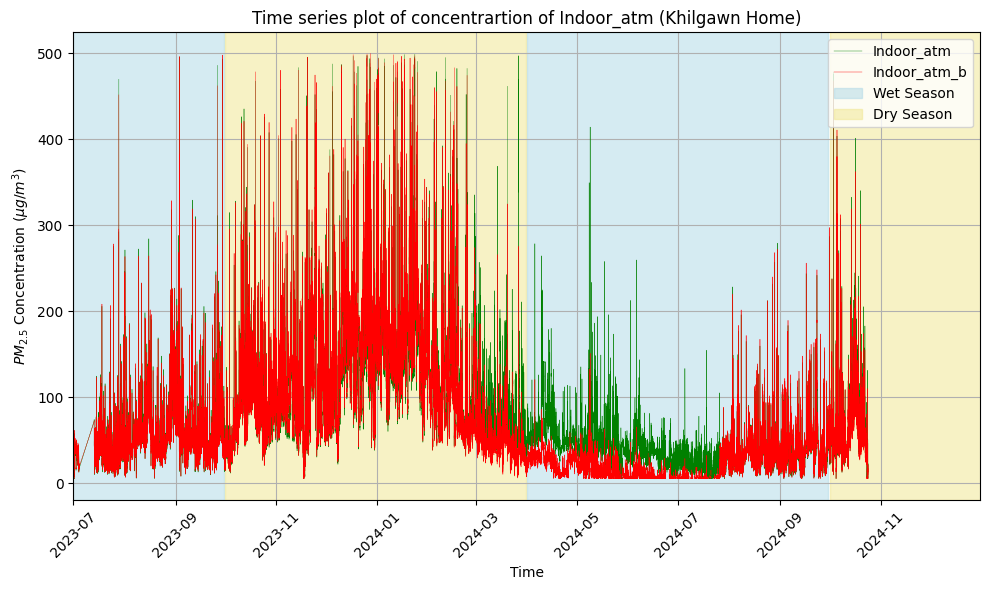

Processed Nakhalpara Home


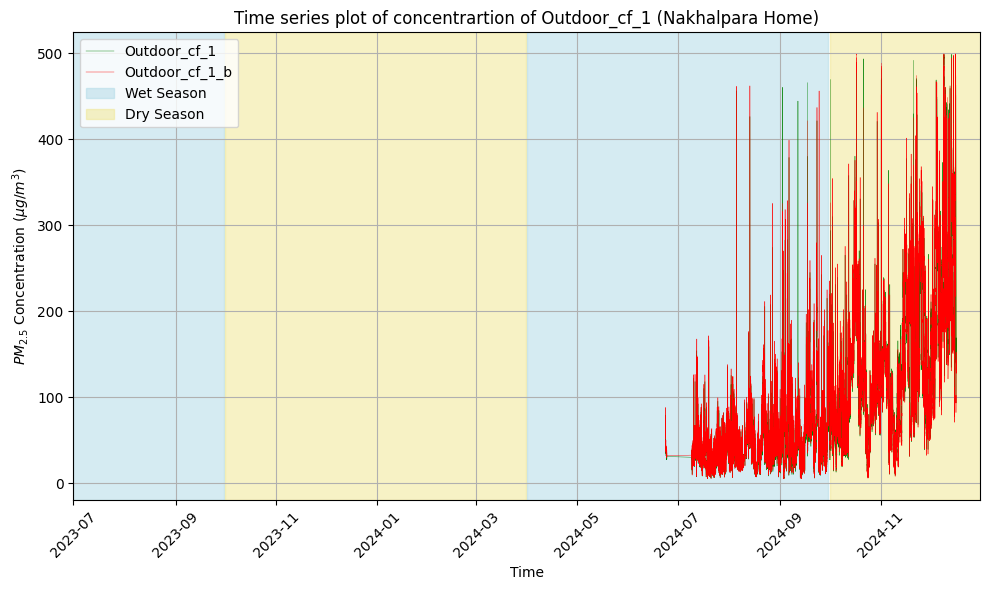

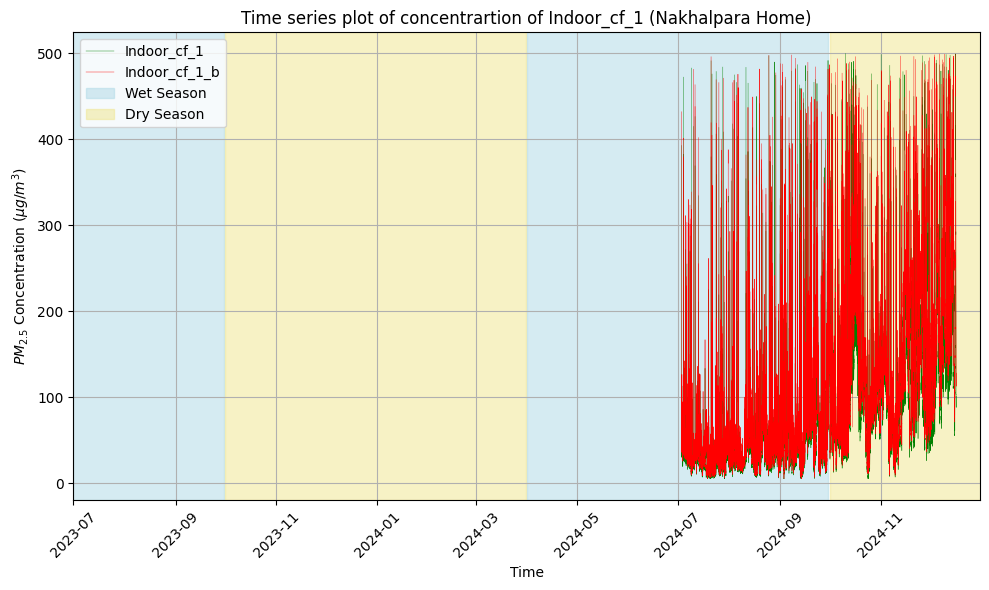

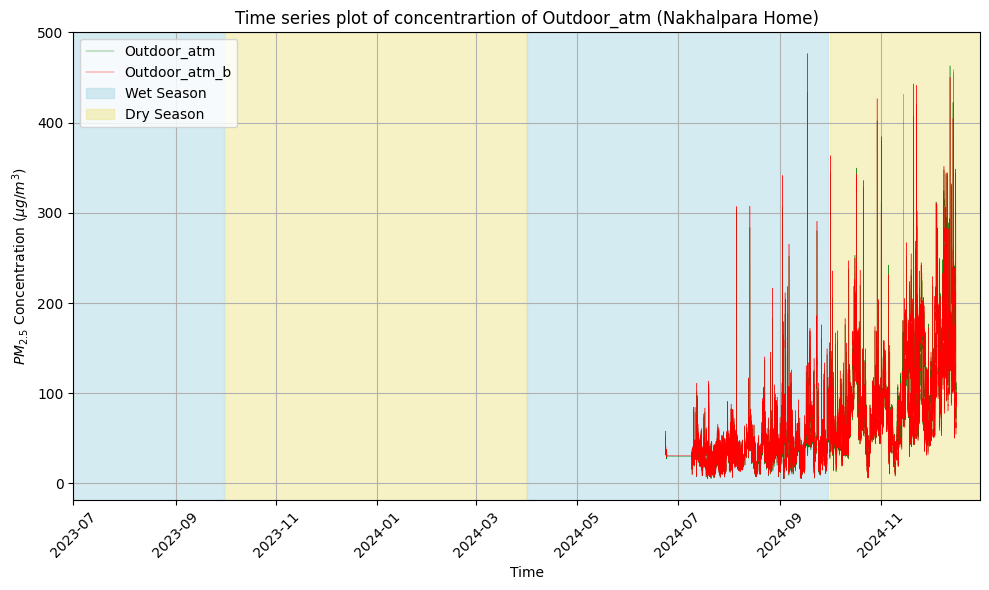

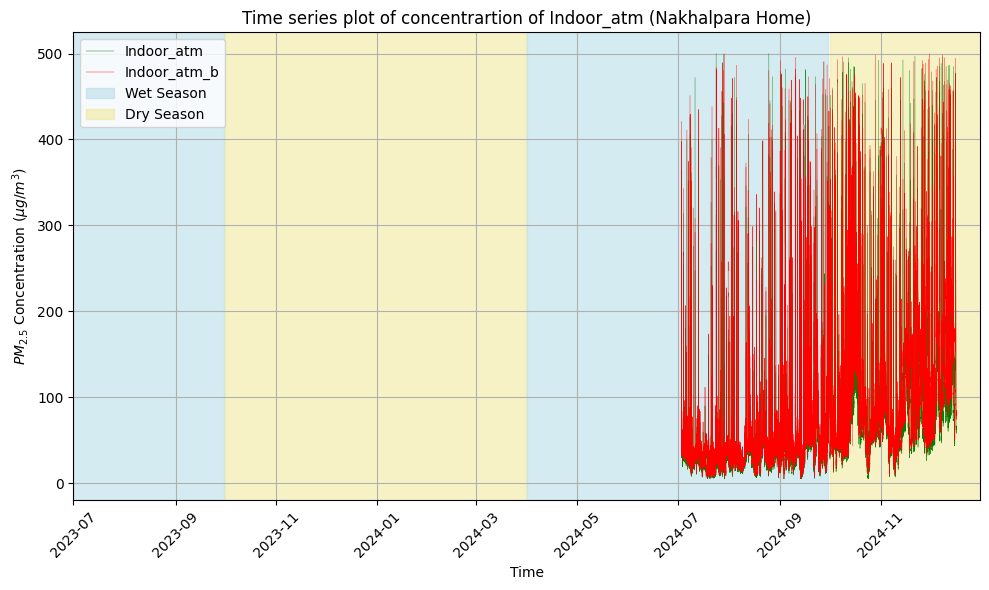

In [23]:
## Plotting (40 plots)

## plotting

dir = 'Data/Raw Clone'

subdirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d)) if "Home" in d]

for home in subdirs:

    indoor_df = pd.read_csv(f'Data/Raw Clone/{home}/Indoor_merged.csv')
    indoor_df['BDDateTime'] = pd.to_datetime(indoor_df['BDDateTime'])
    outdoor_df = pd.read_csv(f'Data/Raw Clone/{home}/Outdoor_merged.csv')
    outdoor_df['BDDateTime'] = pd.to_datetime(outdoor_df['BDDateTime'])
    print(f"Processed {home}")

    def singleFigure(time, data1, data2, home, label, color = None, save = False):
        plt.figure(figsize=(10, 6))

        # Plot the PM2.5 concentrations
        plt.plot(time, data1, label=label, color='green', linestyle='-', markersize=3, linewidth = .3)
        plt.plot(time, data2, label=label + '_b', color='red', linestyle='-', markersize=3, linewidth = .3)

        # Define the background shading for wet and dry seasons
        start_date = 2023
        end_date =  2025

        for year in range(start_date, end_date):
            plt.axvspan(pd.Timestamp(f'{year}-04-01'), pd.Timestamp(f'{year}-09-30'), color='lightblue', alpha=0.5, label='Wet Season' if year == start_date else '')  # Wet season
            plt.axvspan(pd.Timestamp(f'{year}-10-01'), pd.Timestamp(f'{year+1}-03-31'), color='khaki', alpha=0.5, label='Dry Season' if year == start_date else '')  # Dry season

        # Labels and title
        plt.xlabel('Time')
        plt.ylabel(r'$PM_{2.5}$ Concentration ($\mu g/m^3$)')
        plt.title(f'Time series plot of concentrartion of {label.split(' ')[0]} ({home})')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)  # Rotate time labels for better visibility
        plt.tight_layout()
        plt.xlim(
            pd.to_datetime("2023-07-01"),
            pd.to_datetime("2024-12-31")
        )
        if save: plt.savefig(os.path.join("time series" ,f"{home}_{label}.png"), dpi = 300)
        plt.show()

    singleFigure(outdoor_df['BDDateTime'], outdoor_df['pm2_5_cf_1'], outdoor_df['pm2_5_cf_1_b'], home, 'Outdoor_cf_1', "red", True)
    singleFigure(indoor_df['BDDateTime'], indoor_df['pm2_5_cf_1'], indoor_df['pm2_5_cf_1_b'],home, 'Indoor_cf_1', "green", True)
    singleFigure(outdoor_df['BDDateTime'], outdoor_df['pm2_5_atm'], outdoor_df['pm2_5_atm_b'],home, 'Outdoor_atm', "red", True)
    singleFigure(indoor_df['BDDateTime'], indoor_df['pm2_5_atm'], indoor_df['pm2_5_atm_b'], home, 'Indoor_atm', "green", True)


##### Combinig 2 channels 
* either on average, or one of the channels

In [24]:
## merging channel

conditions =   {'Mohakhali Home': {'Indoor': {'atm': 'average', 'cf': 'average'},
                                    'Outdoor': {'atm': 'average', 'cf': 'average'}},

                'Mohammadpur Home': {'Indoor': {'atm': 'average', 'cf': 'average'},
                                    'Outdoor': {'atm': 'b', 'cf': 'b'}},

                'Ajimpur Home': {'Indoor': {'atm': 'b', 'cf': 'b'},
                                    'Outdoor': {'atm': 'b', 'cf': 'b'}},

                'Badda Home': {'Indoor': {'atm': 'a', 'cf': 'a'},
                                    'Outdoor': {'atm': 'average', 'cf': 'average'}},

                'Banasree Home': {'Indoor': {'atm': 'b', 'cf': 'b'},
                                    'Outdoor': {'atm': 'average', 'cf': 'average'}},
                
                'Dania Home': {'Indoor': {'atm': 'b', 'cf': 'b'},
                                    'Outdoor': {'atm': 'average', 'cf': 'average'}},

                'Dhanmondi Home': {'Indoor': {'atm': 'null', 'cf': 'null'},
                                    'Outdoor': {'atm': 'null', 'cf': 'null'}},

                'Khilgawn Home': {'Indoor': {'atm': 'a', 'cf': 'a'},
                                    'Outdoor': {'atm': 'a', 'cf': 'a'}},

                'Nakhalpara Home': {'Indoor': {'atm': 'average', 'cf': 'average'},
                                    'Outdoor': {'atm': 'average', 'cf': 'average'}},

                'Dhakeshwari Home': {'Indoor': {'atm': 'average', 'cf': 'average'},
                                    'Outdoor': {'atm': 'average', 'cf': 'average'}}}

## average calculation
dir = "Data/Raw Clone"
subdirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d)) if "Home" in d]
for subdir in tqdm(subdirs):
    print(f'pricessing {subdir}')
    files = [('Indoor','Indoor_merged.csv'), ("Outdoor",'Outdoor_merged.csv')]
    for type, file in files:
        df = pd.read_csv(os.path.join(dir, subdir, file))
        cond = conditions[subdir][type]
        
        if cond['atm'] == 'average':
            df['pm2_5_atm_comb'] = (df['pm2_5_atm'] + df['pm2_5_atm_b'])/2
        if cond['atm'] == 'a':
            df['pm2_5_atm_comb'] = df['pm2_5_atm']
        if cond['atm'] == 'b':
            df['pm2_5_atm_comb'] = df['pm2_5_atm_b']
        
        if cond['cf'] == 'average':
            df['pm2_5_cf_1_comb'] = (df['pm2_5_cf_1'] + df['pm2_5_cf_1_b'])/2
        if cond['cf'] == 'a':
            df['pm2_5_cf_1_comb'] = df['pm2_5_cf_1']
        if cond['cf'] == 'b':
            df['pm2_5_cf_1_comb'] = df['pm2_5_cf_1_b']
        df.to_csv(os.path.join(dir, subdir, "".join(file.split('.')[0:1] + ['_after_combined.csv'])), index=False)

  0%|          | 0/9 [00:00<?, ?it/s]

pricessing Dhakeshwari Home
pricessing Mohakhali Home
pricessing Mohammadpur Home
pricessing Ajimpur Home
pricessing Badda Home
pricessing Banasree Home
pricessing Dania Home
pricessing Khilgawn Home
pricessing Nakhalpara Home


Processed Dhakeshwari Home


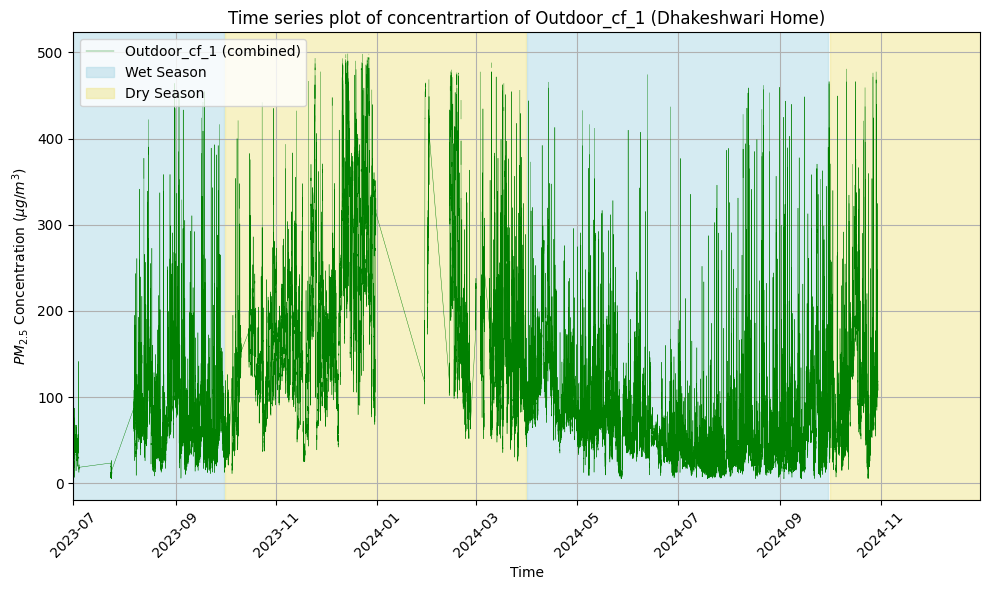

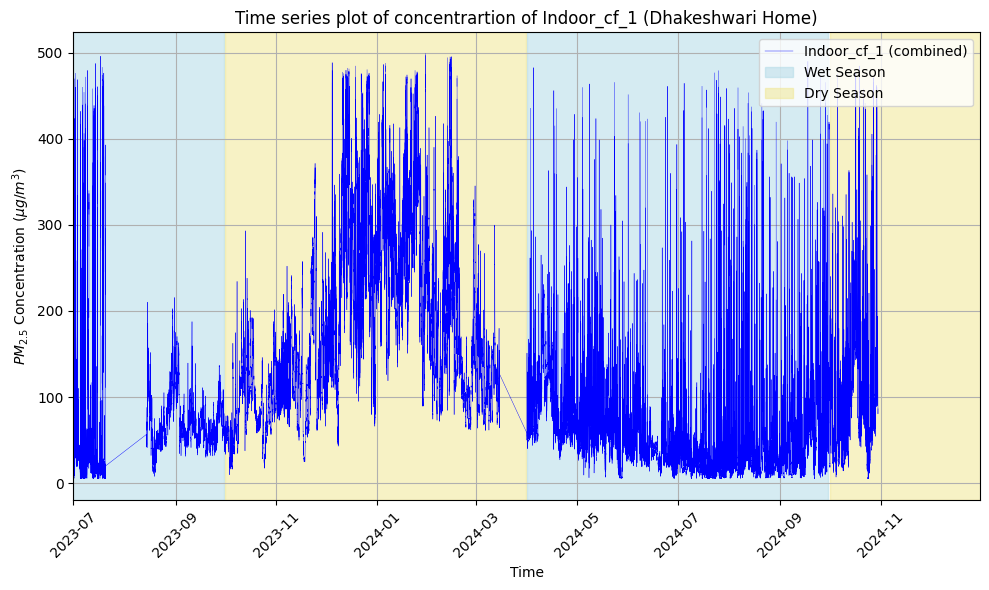

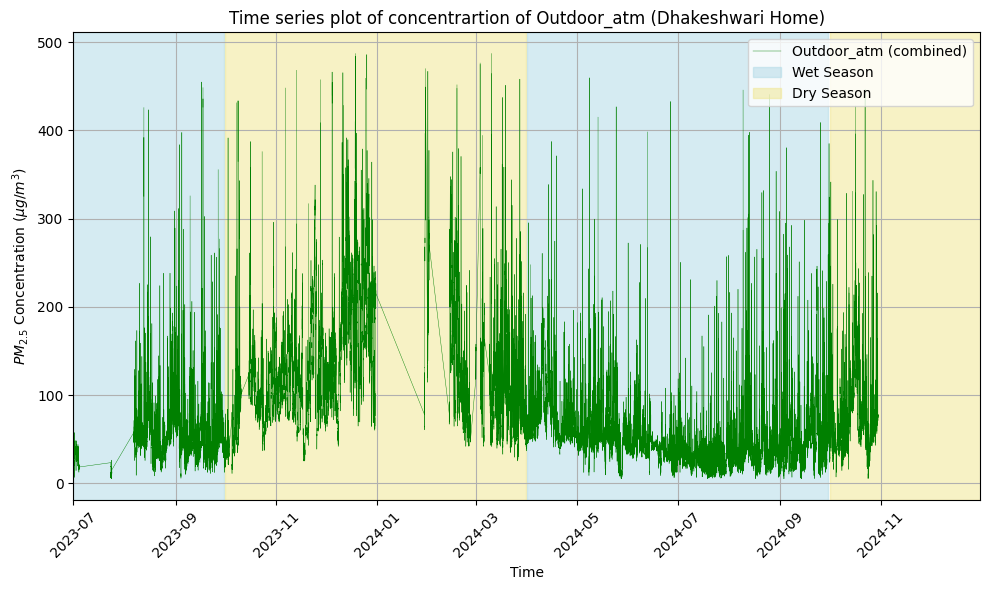

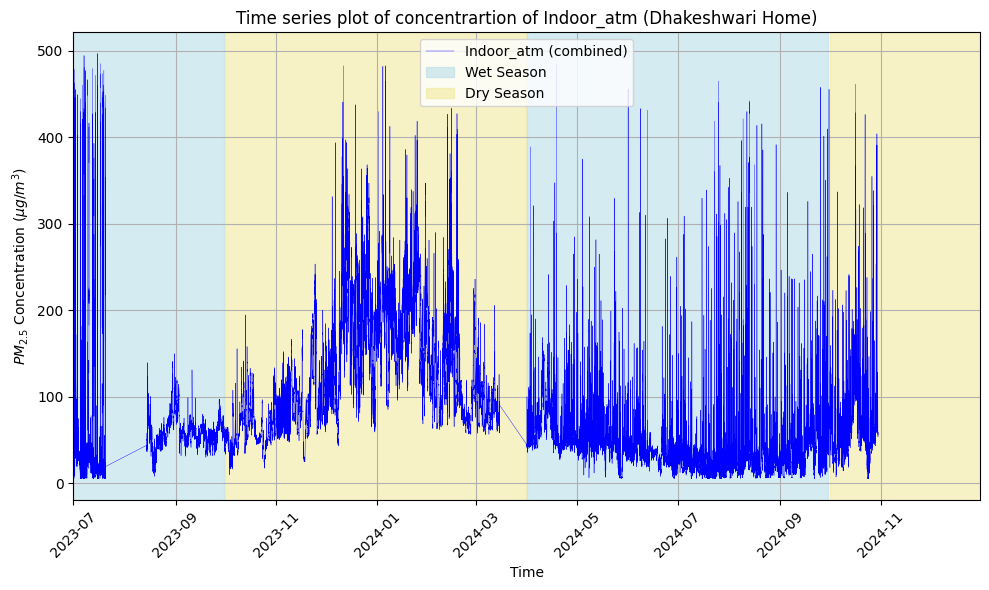

Processed Mohakhali Home


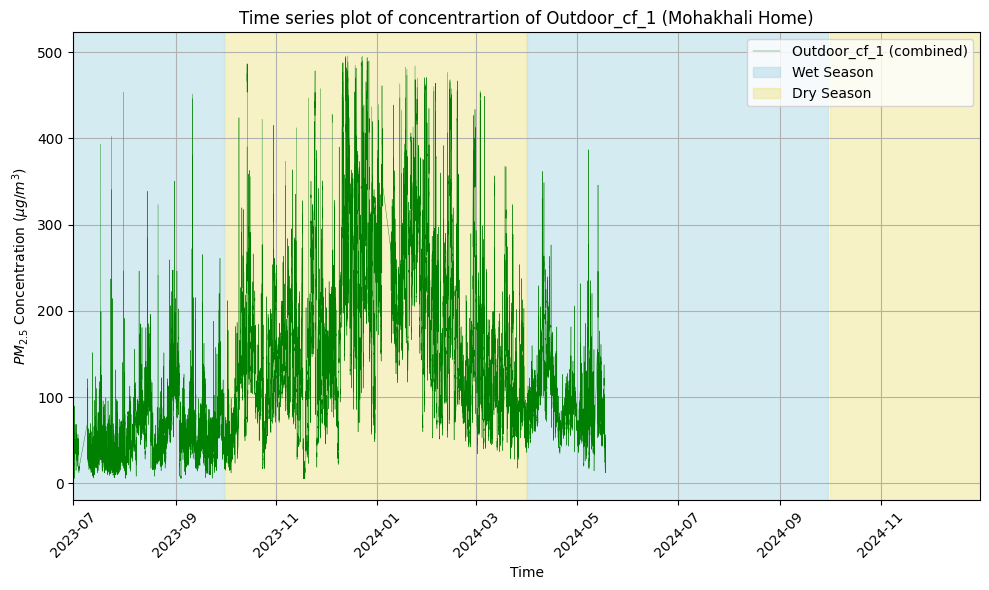

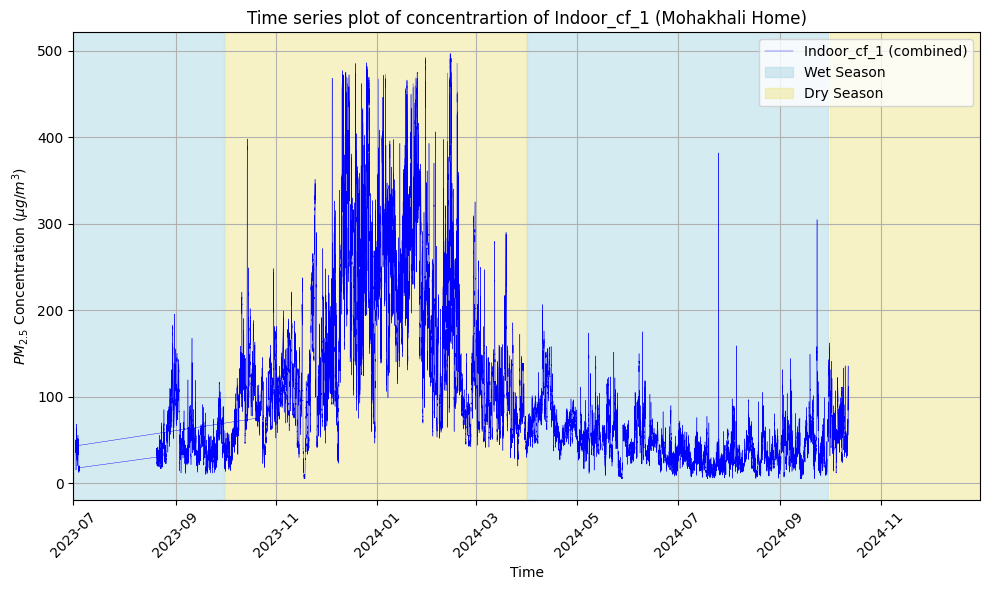

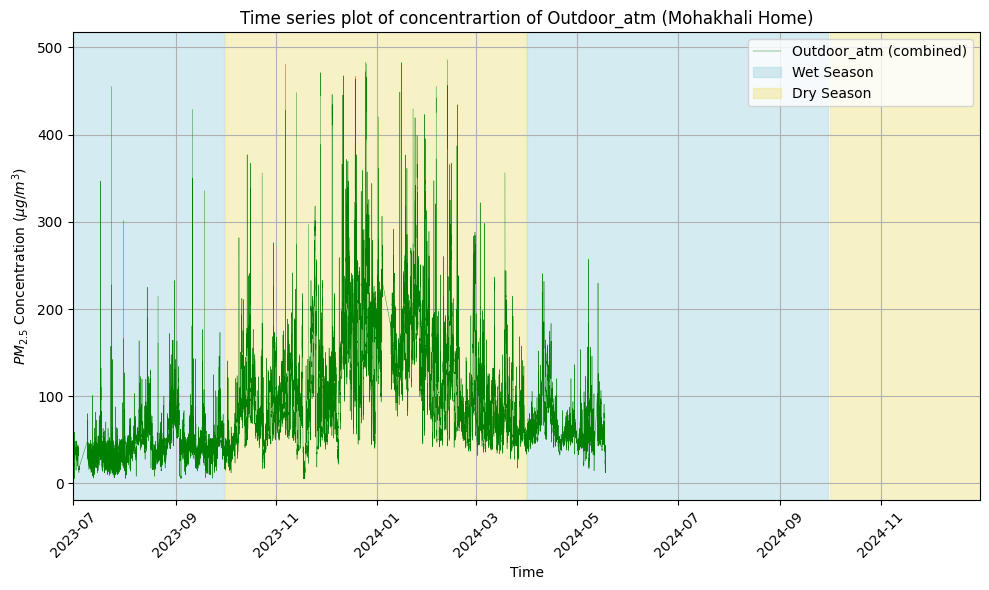

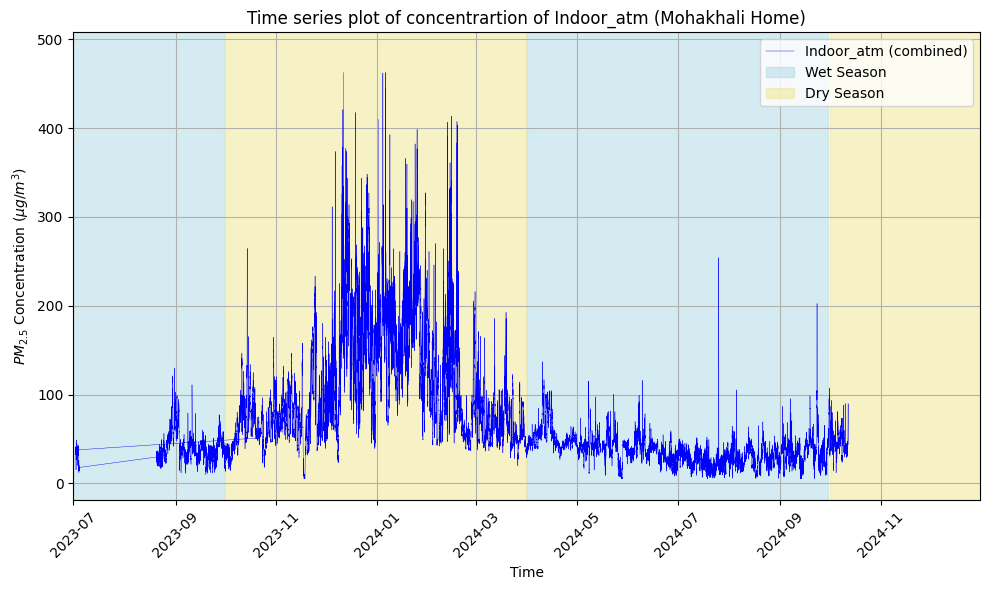

Processed Mohammadpur Home


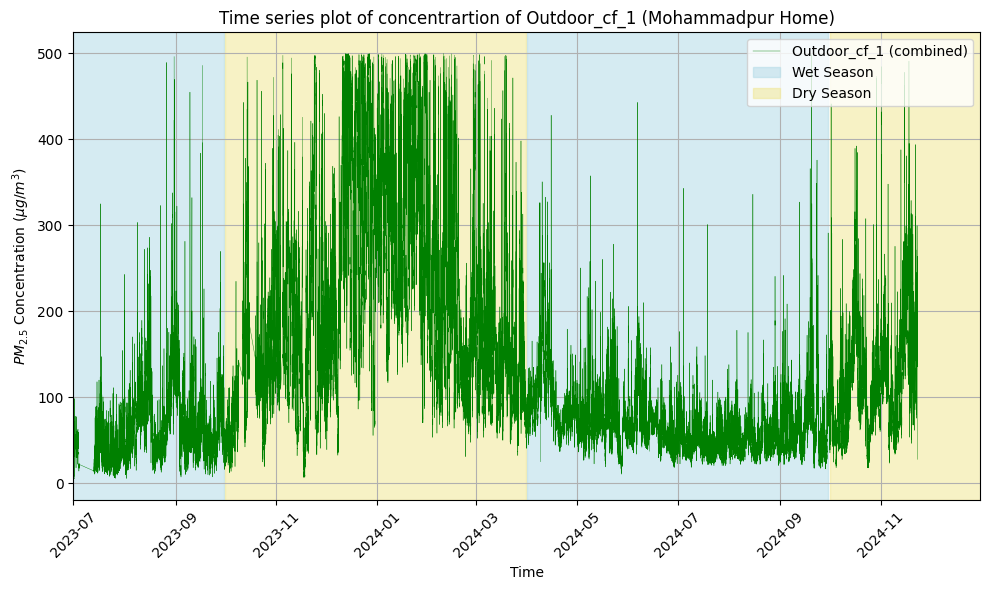

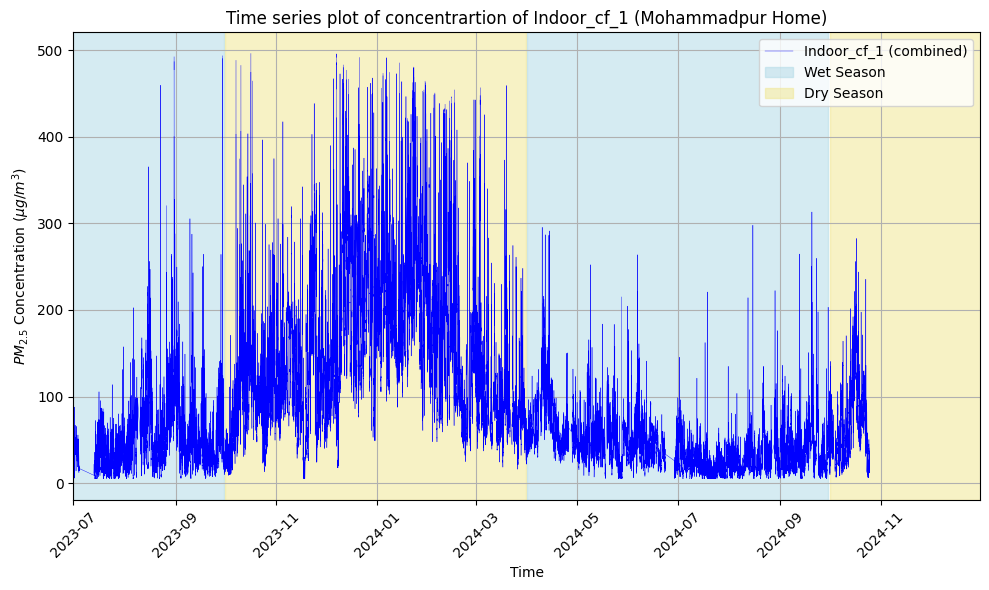

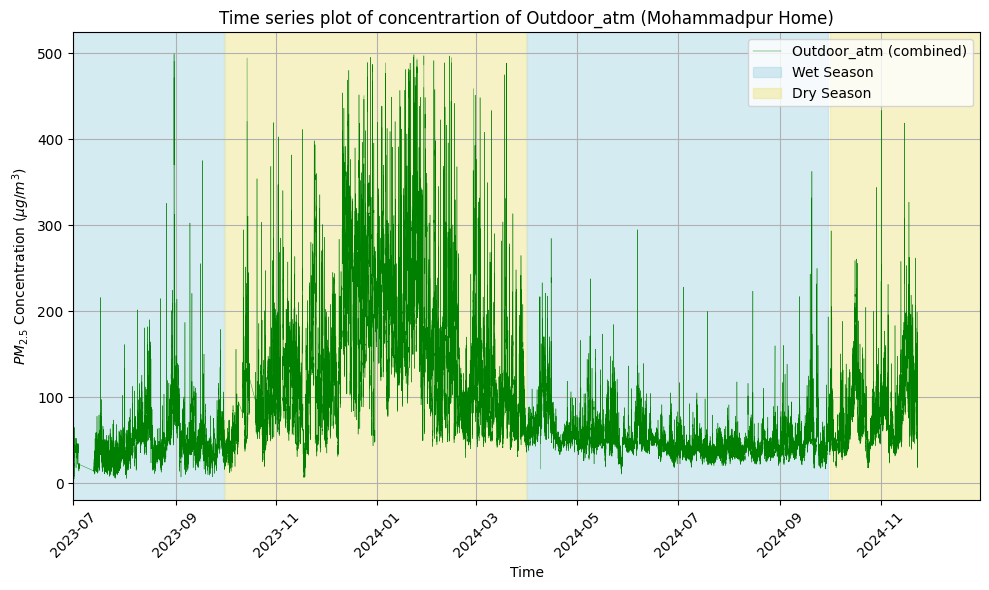

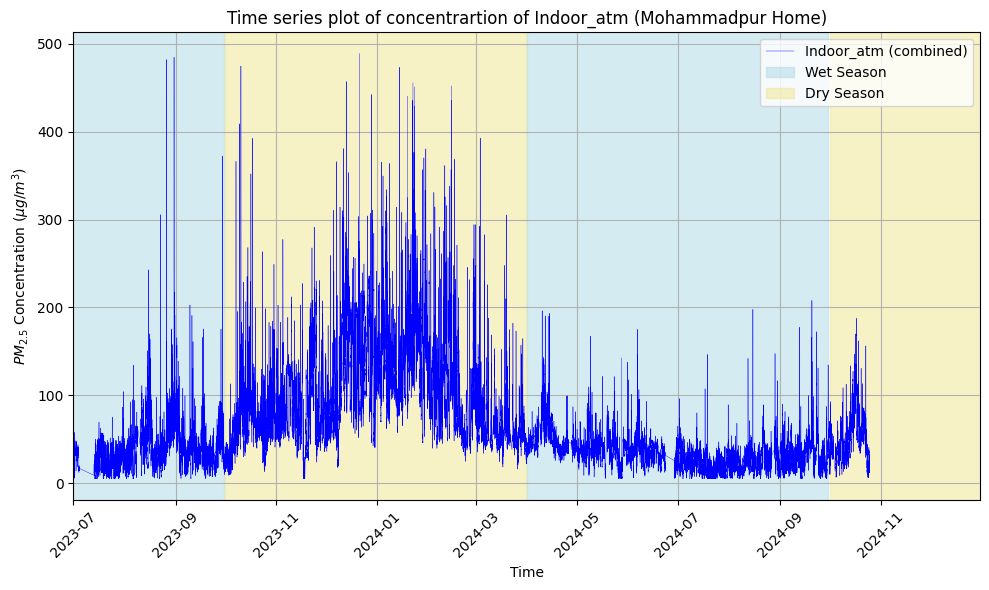

Processed Ajimpur Home


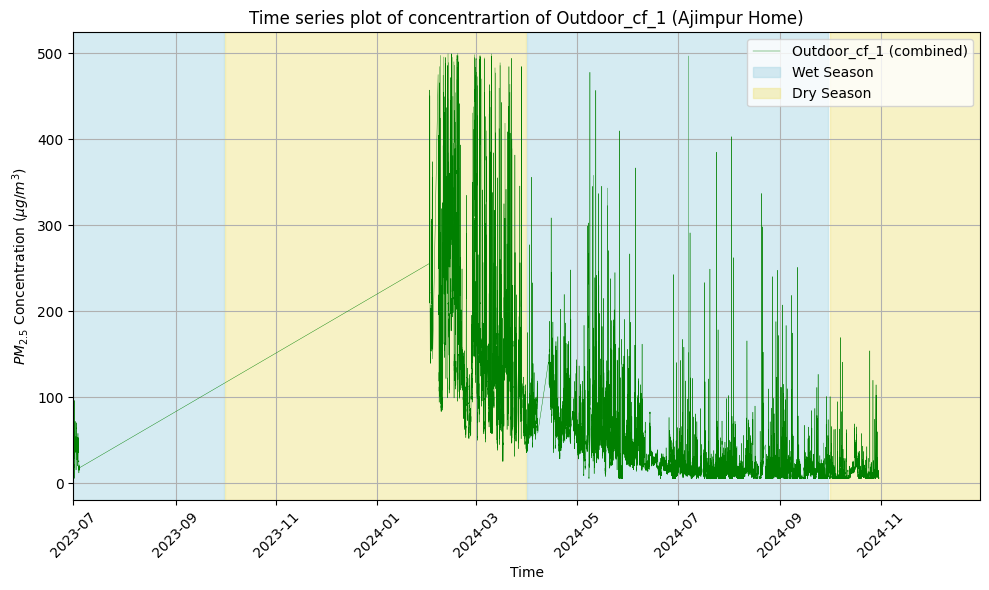

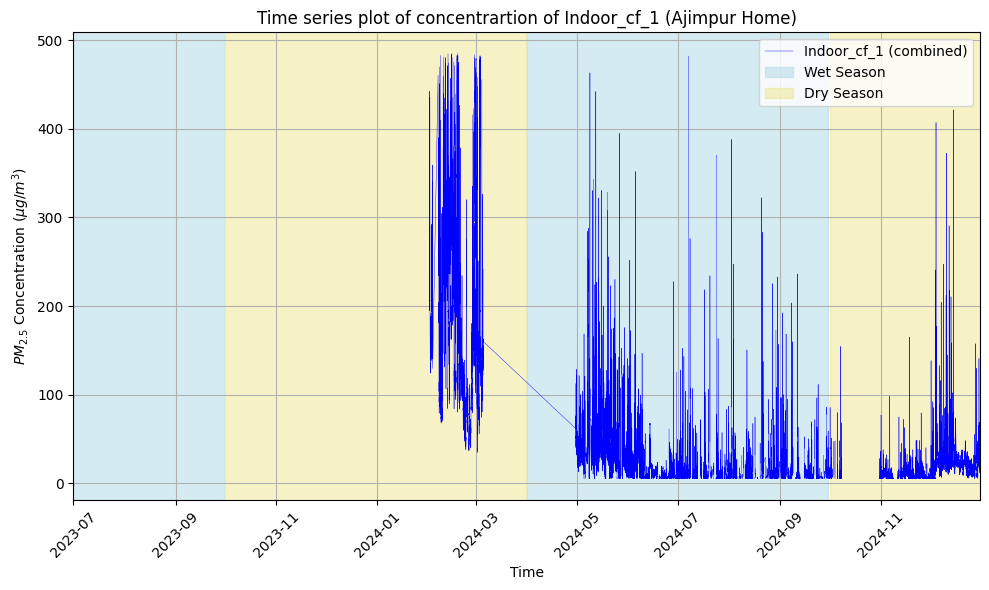

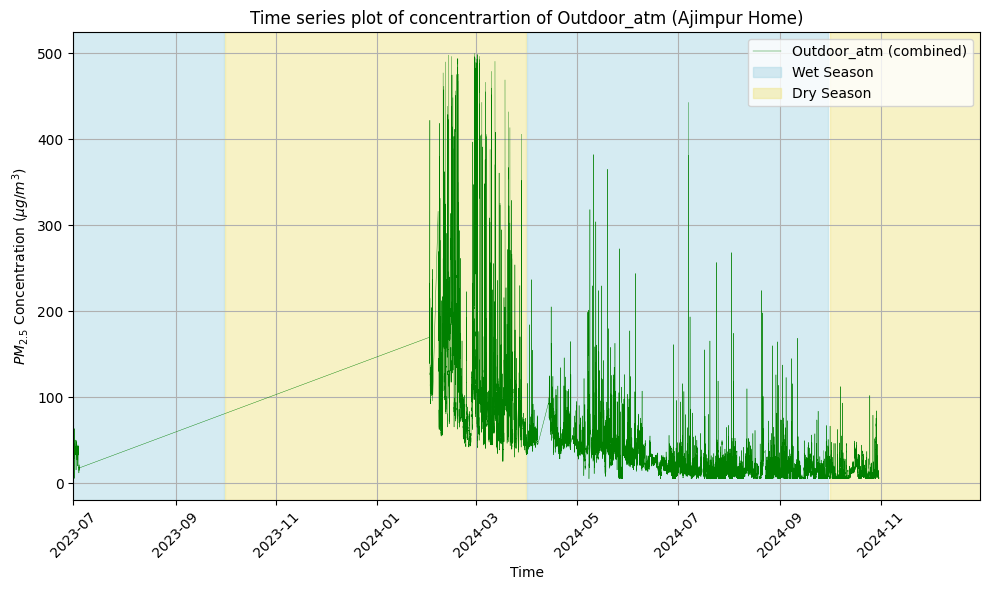

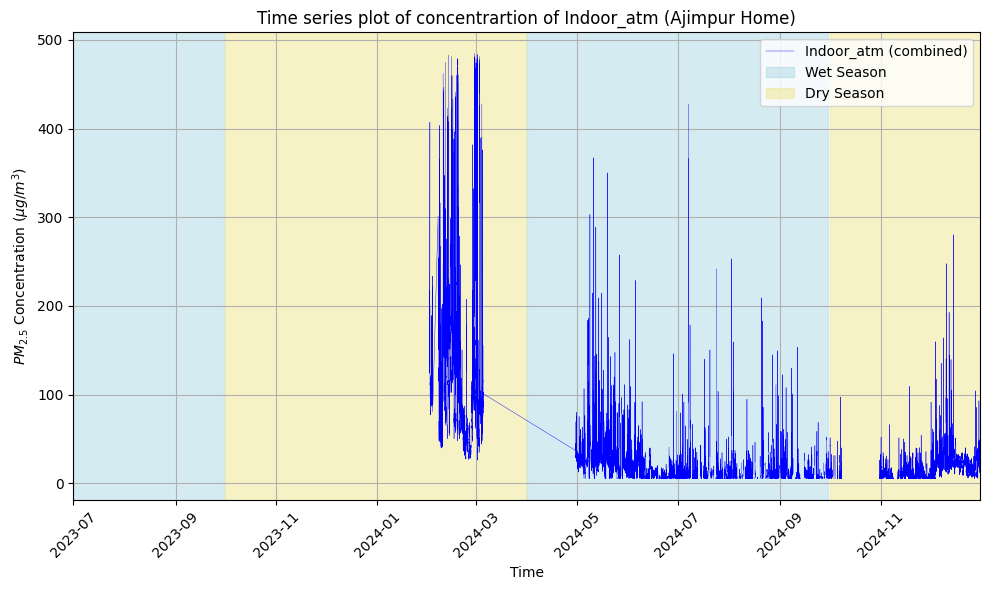

Processed Badda Home


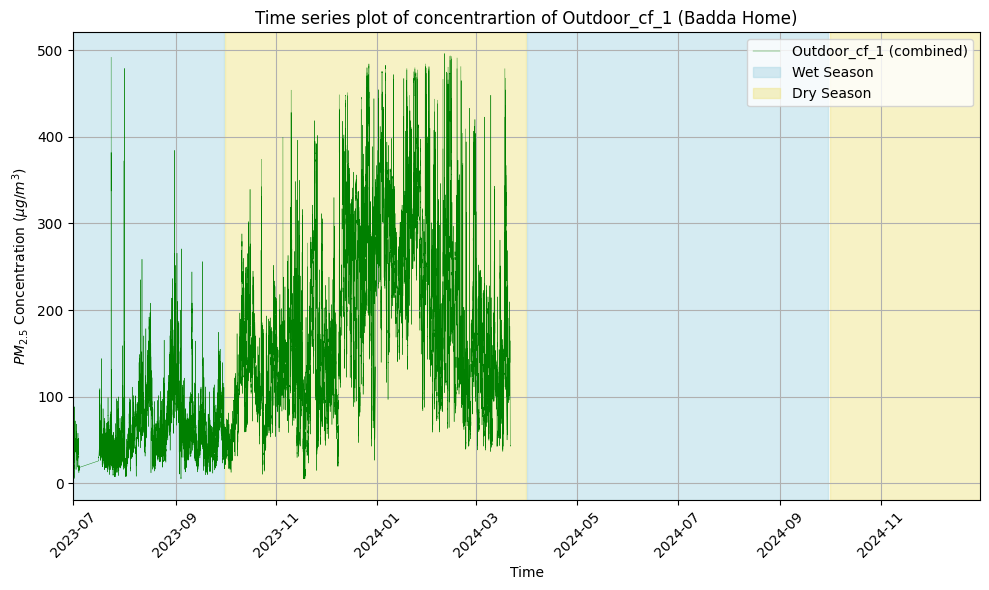

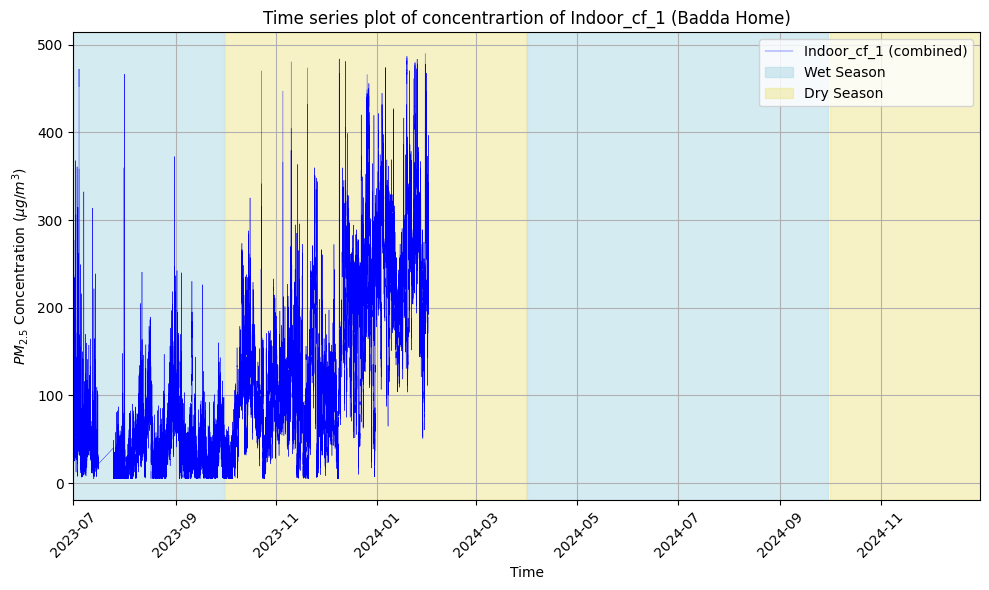

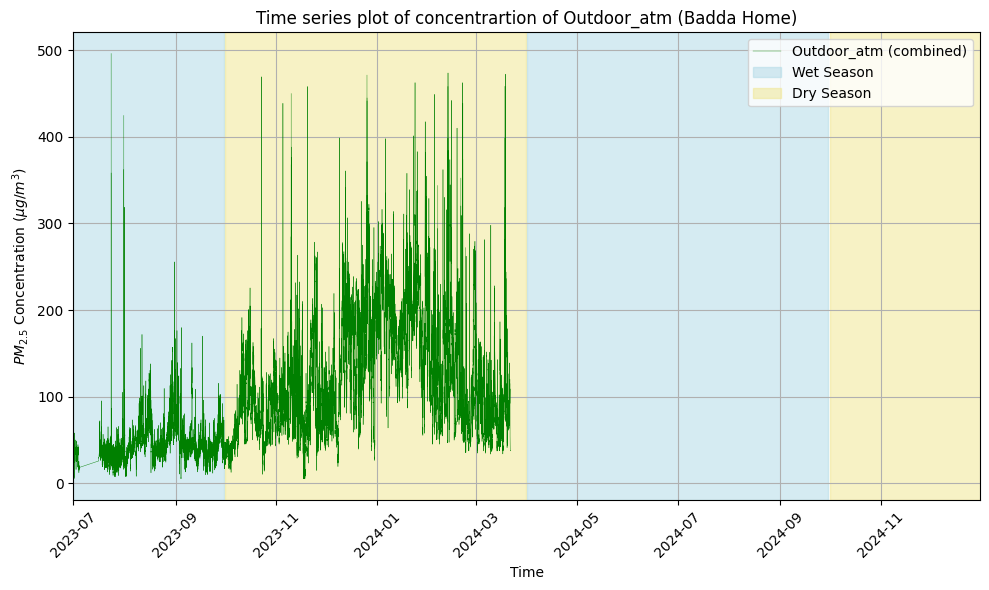

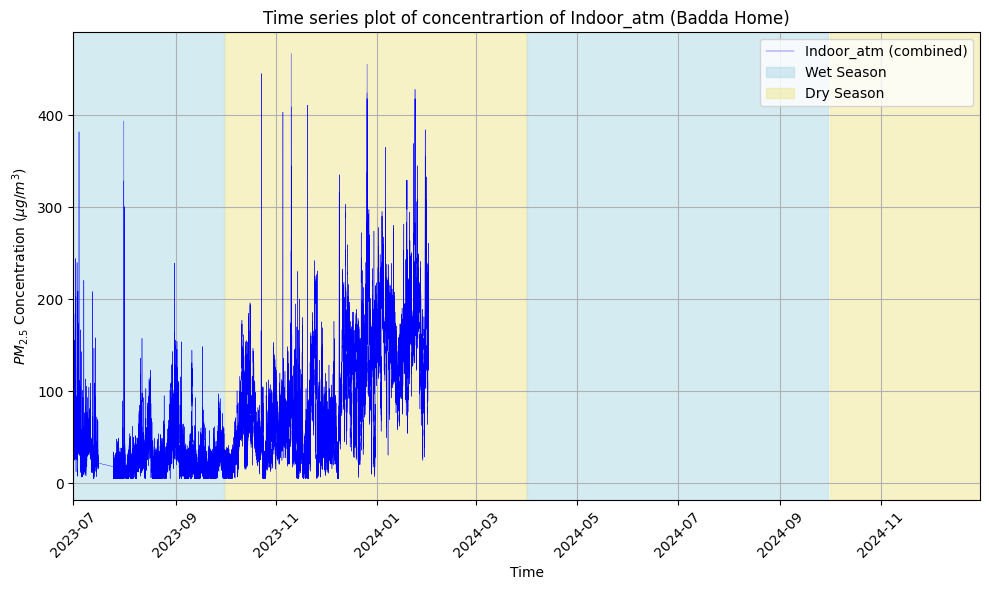

Processed Banasree Home


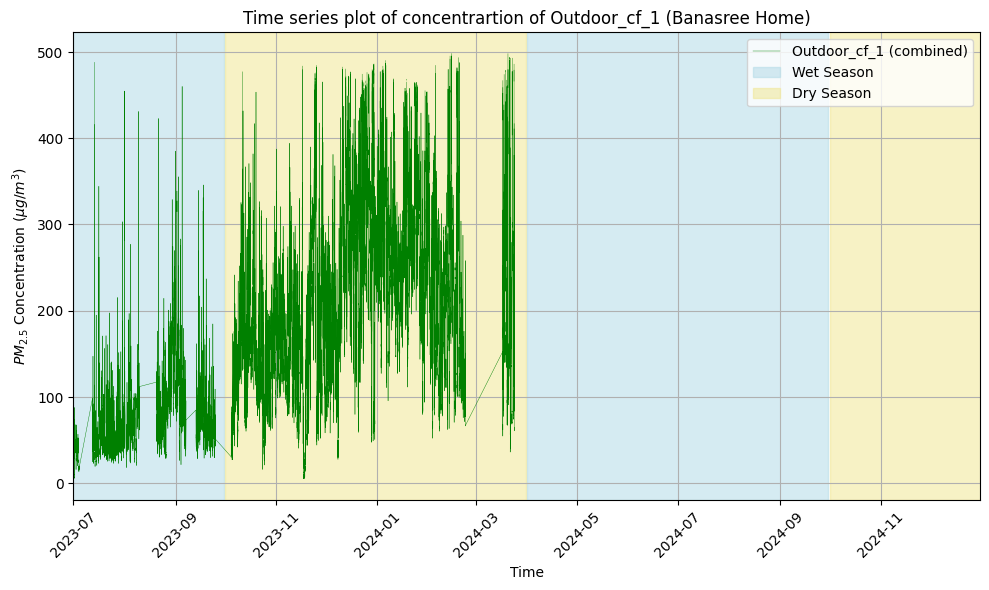

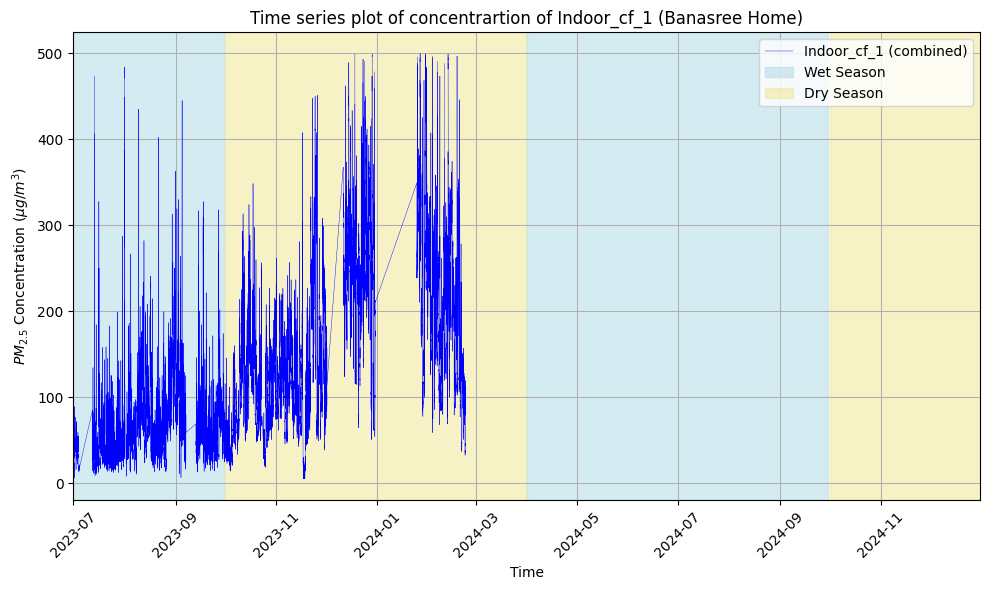

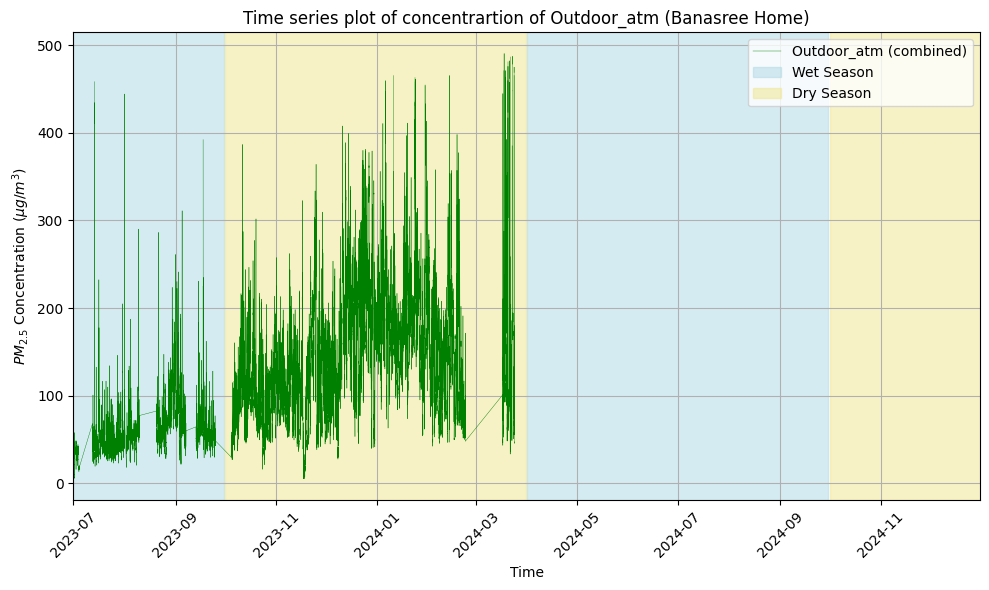

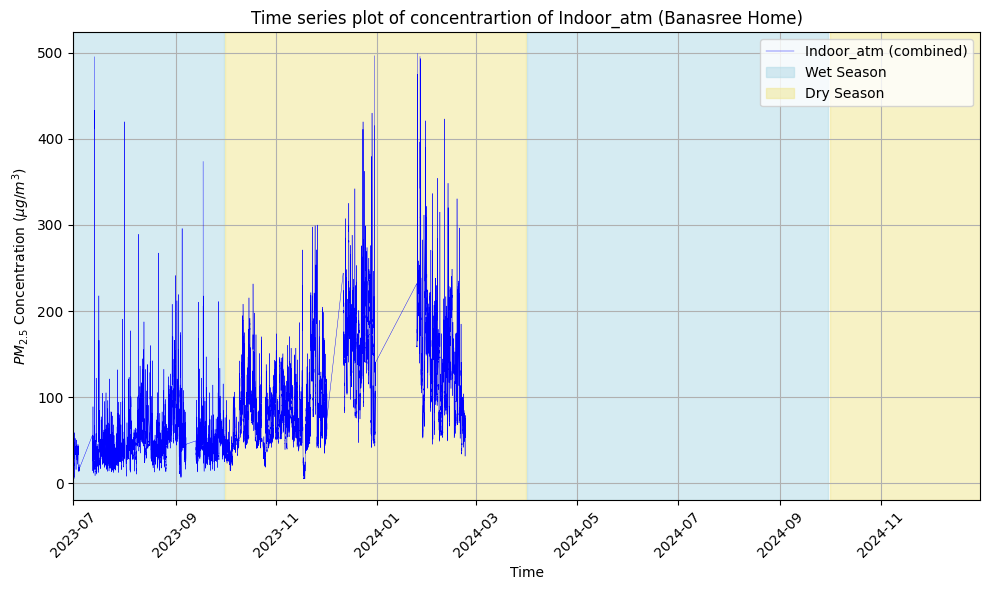

Processed Dania Home


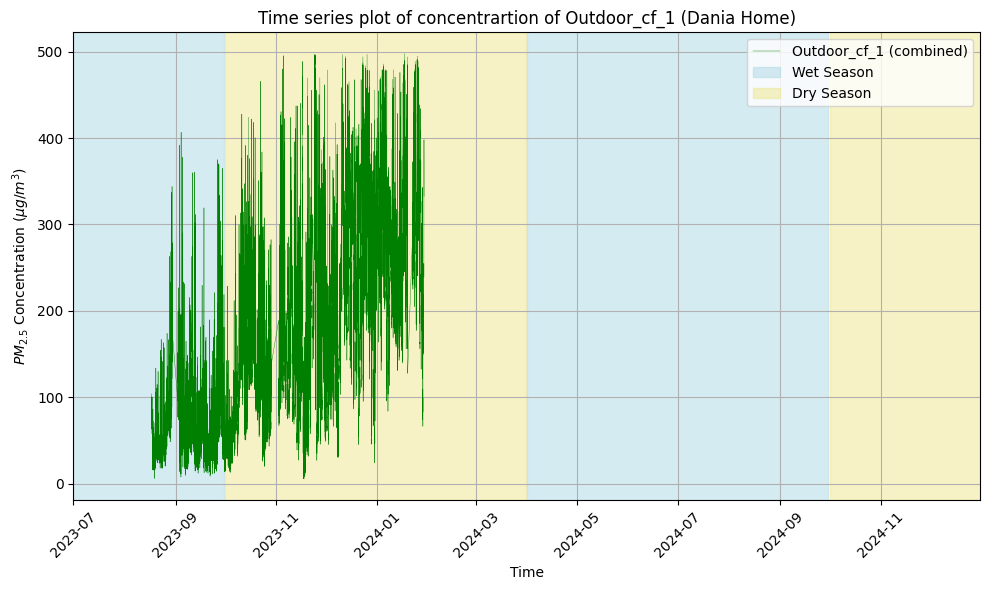

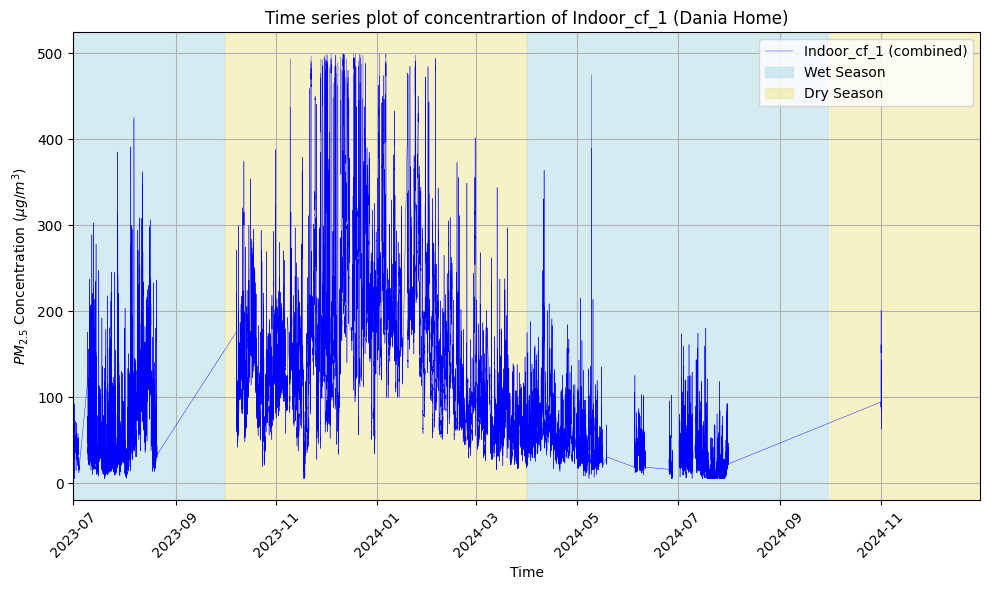

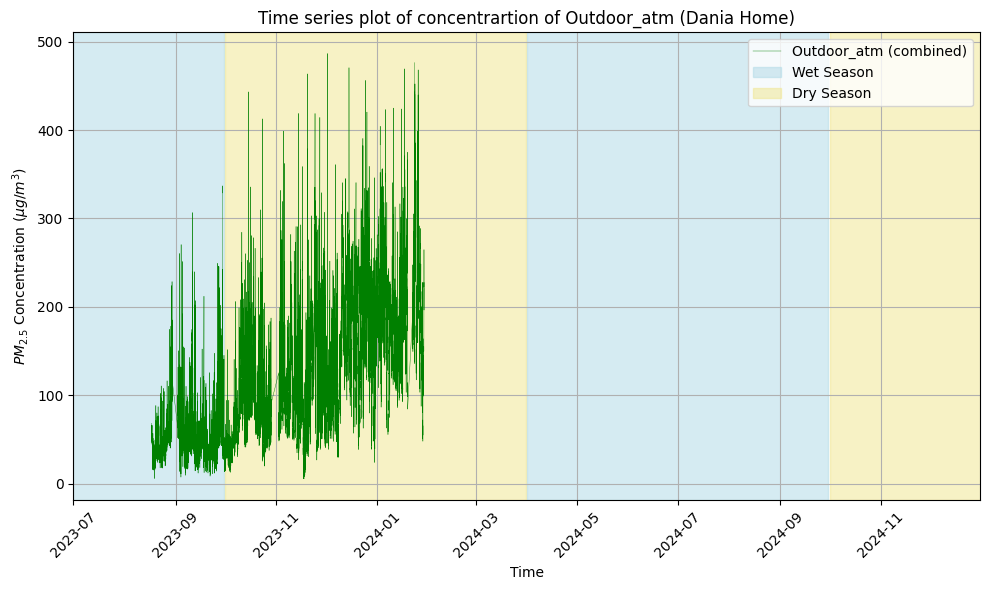

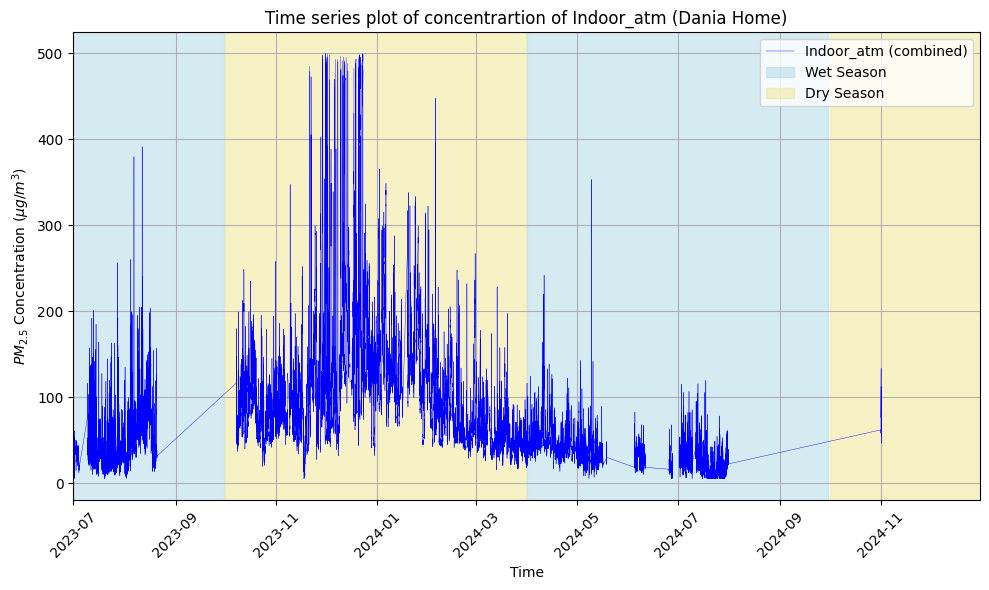

Processed Khilgawn Home


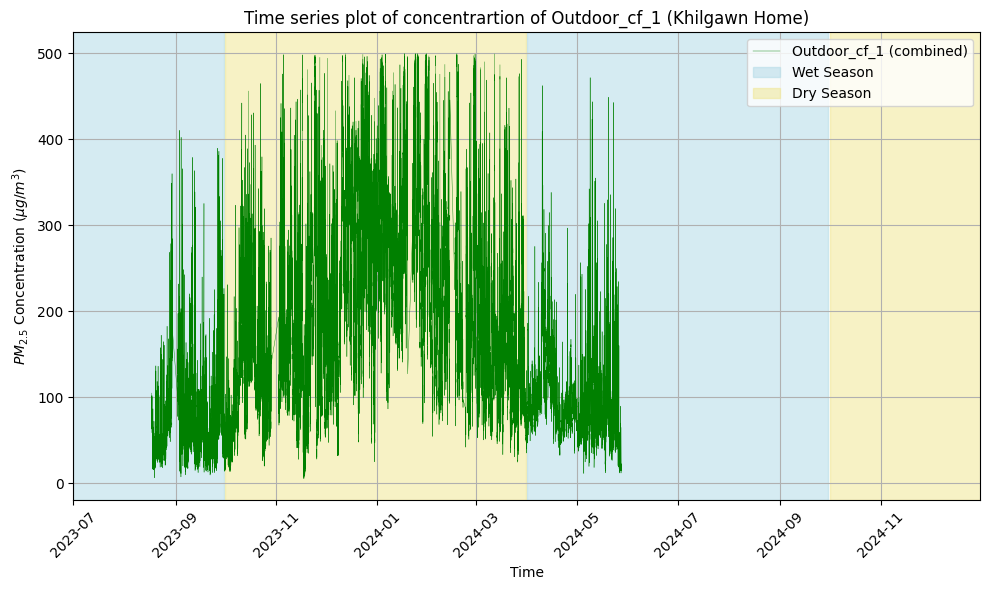

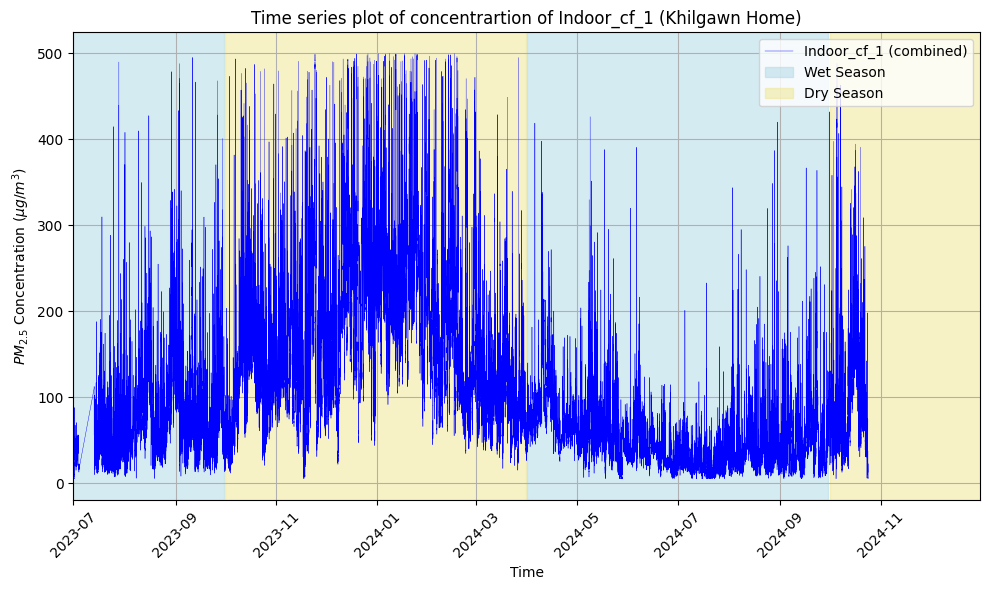

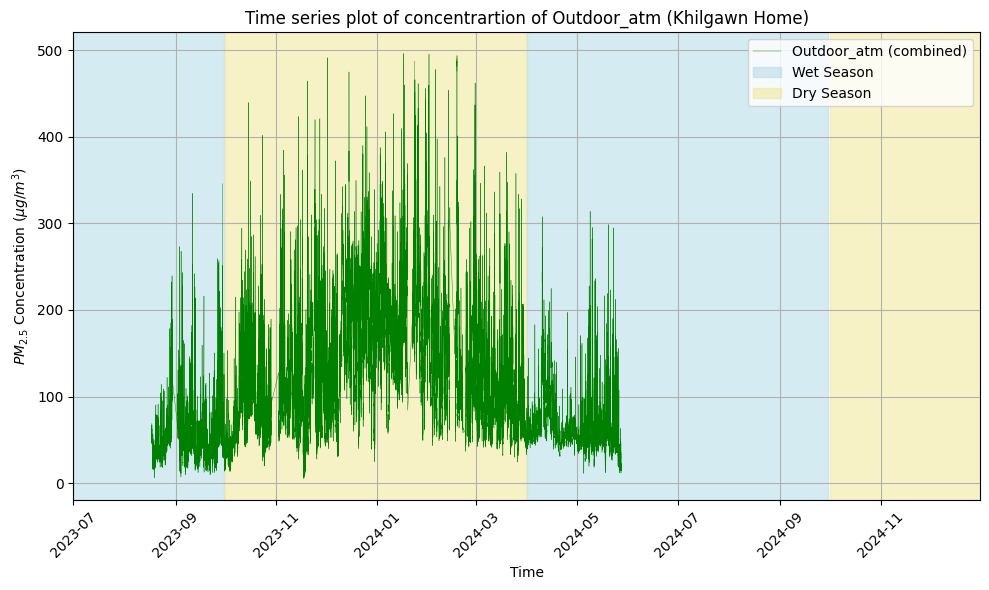

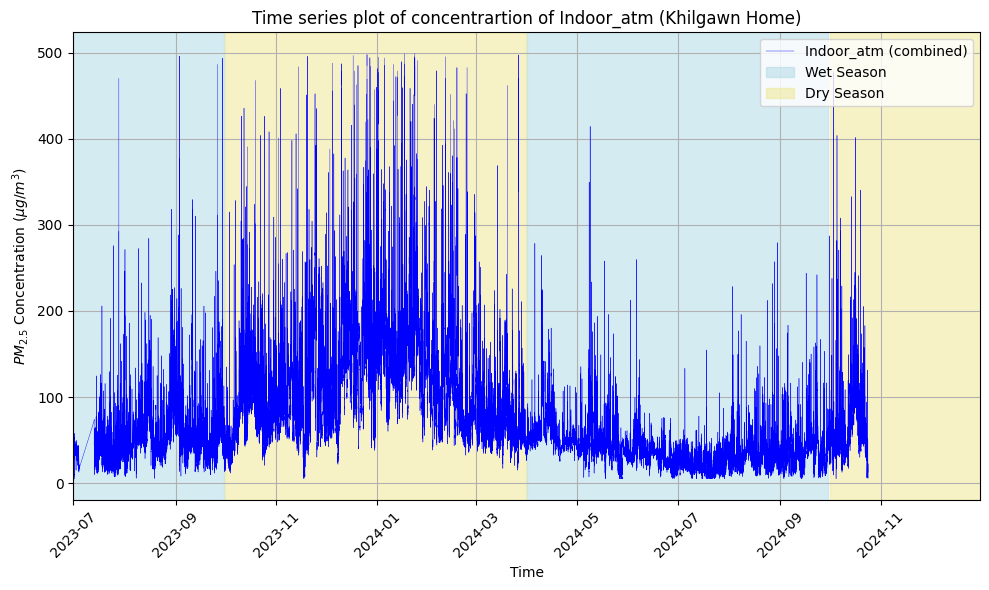

Processed Nakhalpara Home


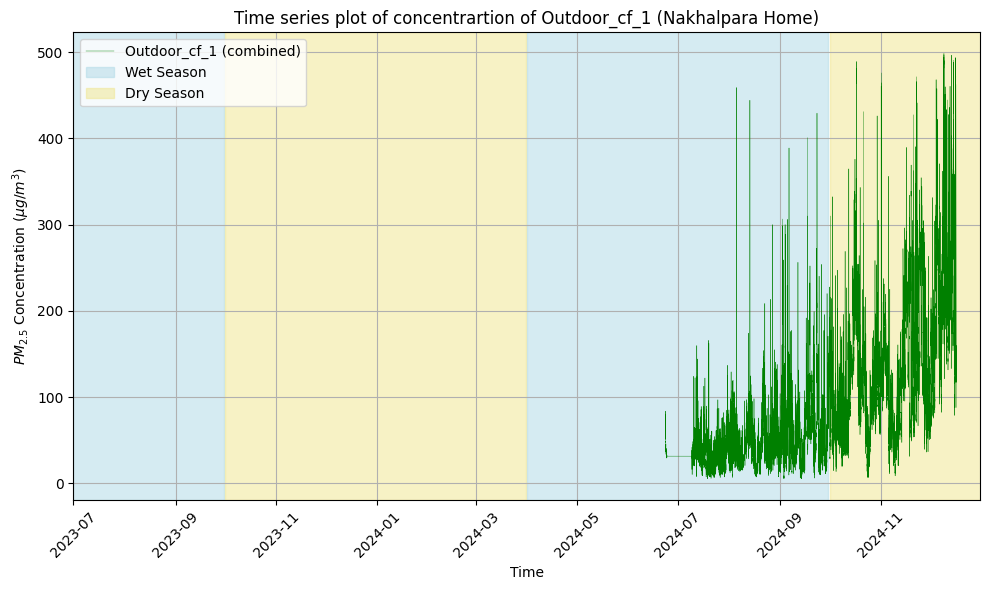

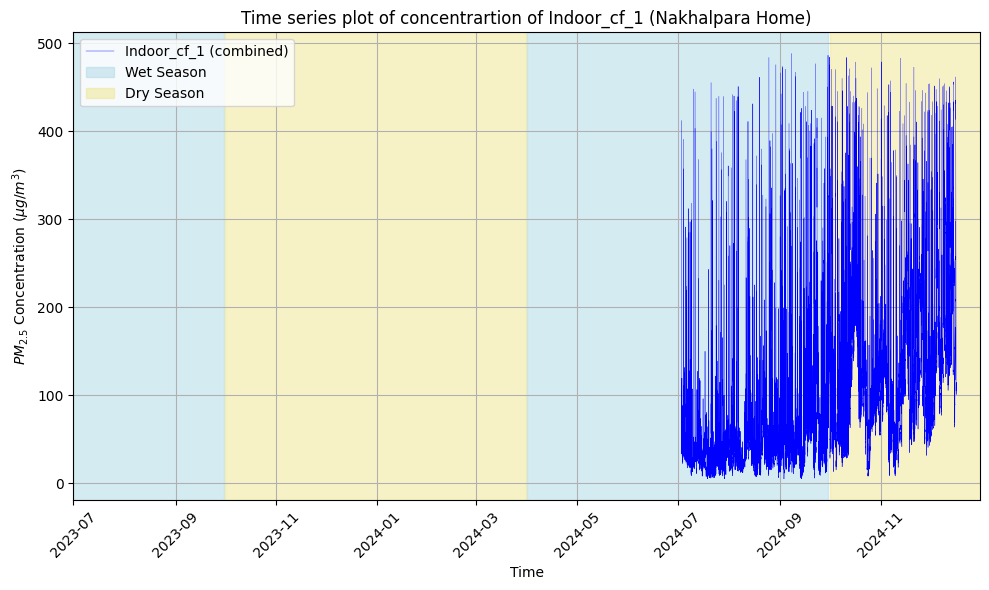

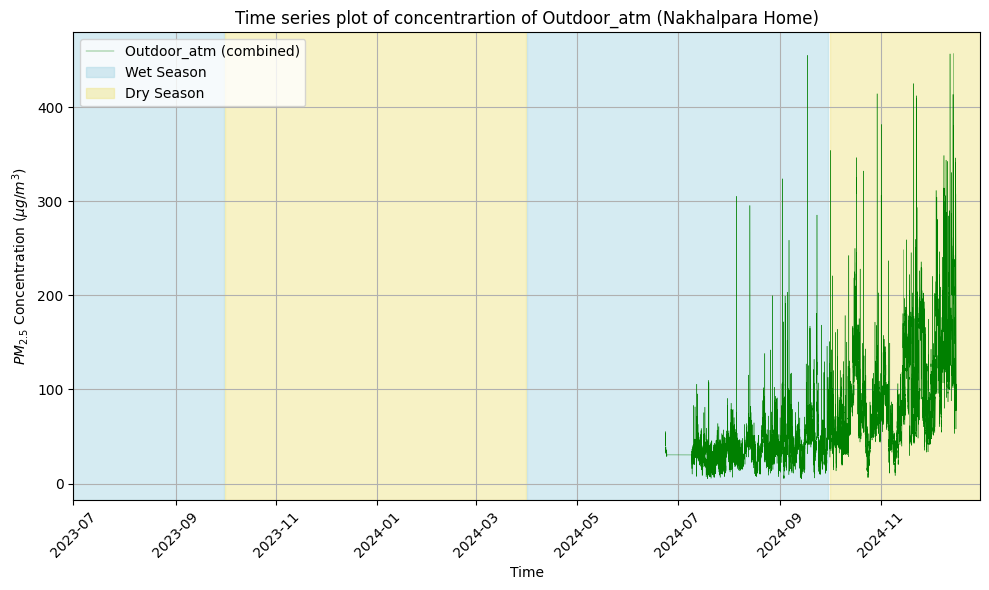

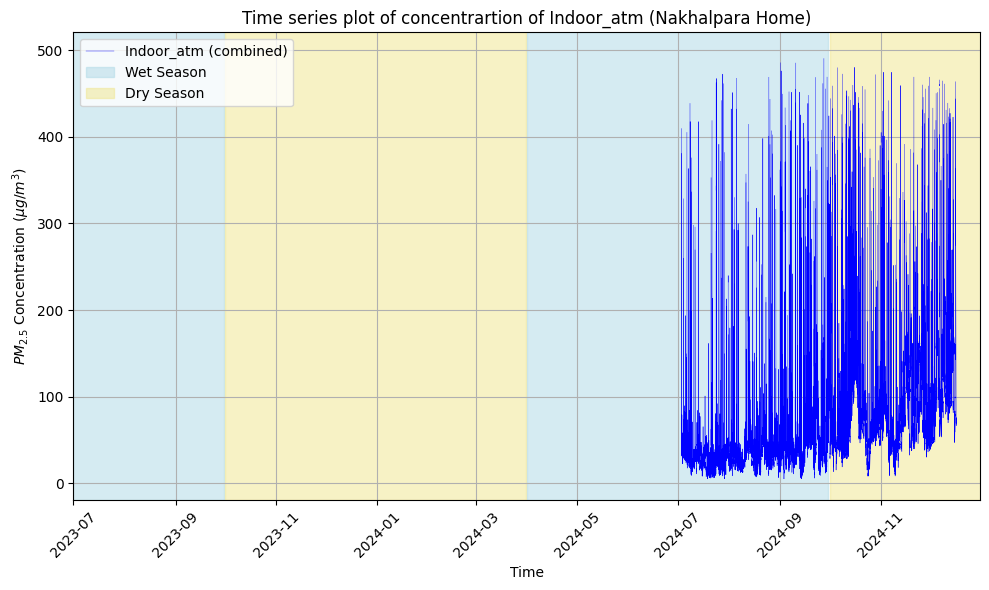

In [25]:
## Plotting (40 plots)

## plotting

dir = 'Data/Raw Clone'

subdirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d)) if "Home" in d]

for home in subdirs:

    indoor_df = pd.read_csv(f'Data/Raw Clone/{home}/Indoor_merged_after_combined.csv')
    indoor_df['BDDateTime'] = pd.to_datetime(indoor_df['BDDateTime'])
    outdoor_df = pd.read_csv(f'Data/Raw Clone/{home}/Outdoor_merged_after_combined.csv')
    outdoor_df['BDDateTime'] = pd.to_datetime(outdoor_df['BDDateTime'])
    print(f"Processed {home}")

    def singleFigure(time, data1, home, label, color = None, save = False):
        plt.figure(figsize=(10, 6))

        # Plot the PM2.5 concentrations
        plt.plot(time, data1, label=label, color=color, linestyle='-', markersize=3, linewidth = .3)

        # Define the background shading for wet and dry seasons
        start_date = 2023
        end_date =  2025

        for year in range(start_date, end_date):
            plt.axvspan(pd.Timestamp(f'{year}-04-01'), pd.Timestamp(f'{year}-09-30'), color='lightblue', alpha=0.5, label='Wet Season' if year == start_date else '')  # Wet season
            plt.axvspan(pd.Timestamp(f'{year}-10-01'), pd.Timestamp(f'{year+1}-03-31'), color='khaki', alpha=0.5, label='Dry Season' if year == start_date else '')  # Dry season

        # Labels and title
        plt.xlabel('Time')
        plt.ylabel(r'$PM_{2.5}$ Concentration ($\mu g/m^3$)')
        plt.title(f'Time series plot of concentrartion of {label.split(' ')[0]} ({home})')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)  # Rotate time labels for better visibility
        plt.tight_layout()
        plt.xlim(
            pd.to_datetime("2023-07-01"),
            pd.to_datetime("2024-12-31")
        )
        if save: plt.savefig(os.path.join("time series" ,f"{home}_{label}.png"), dpi = 300)
        plt.show()

    singleFigure(outdoor_df['BDDateTime'], outdoor_df['pm2_5_cf_1_comb'], home, 'Outdoor_cf_1 (combined)', "green", True)
    singleFigure(indoor_df['BDDateTime'], indoor_df['pm2_5_cf_1_comb'], home, 'Indoor_cf_1 (combined)', "blue", True)
    singleFigure(outdoor_df['BDDateTime'], outdoor_df['pm2_5_atm_comb'],home, 'Outdoor_atm (combined)', "green", True)
    singleFigure(indoor_df['BDDateTime'], indoor_df['pm2_5_atm_comb'], home, 'Indoor_atm (combined)', "blue", True)


##### Appling calibration

In [ ]:
## calibration
## (thersholds were applied once again here)

def calibrate_cf_1(time, pm2_5):
    if pd.isnull(time) or pd.isnull(pm2_5):
        return float('nan')
    month = time.month
    if month < 4 or month > 9:
        res =  0.63*pm2_5 - 1.1
    else:
        res =  0.77 * pm2_5 + 6.4
    
    if res >= 5 and res <= 500:
        return res
    else:
        return float('nan')
    
def calibrate_atm(time, pm2_5):
    if pd.isnull(time) or pd.isnull(pm2_5):
        return float('nan')
    month = time.month
    if month < 4 or month > 9:
        res =  0.96*pm2_5 - 2.0
    else:
        res = 1.4 * pm2_5 - 10.23

    if res >= 5 and res <= 500:
        return res
    else:
        return float('nan')


## average calculation
dir = "Data/Raw Clone"
subdirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d)) if "Home" in d]
# subdirs = ["Badda Home"]
for subdir in tqdm(subdirs):
    print(f'processing {subdir}')
    files = [('Indoor','Indoor_merged_after_combined.csv'), ("Outdoor",'Outdoor_merged_after_combined.csv')]
    for type, file in files:
        df = pd.read_csv(os.path.join(dir, subdir, file))
        df['BDDateTime'] = pd.to_datetime(df['BDDateTime'])
        
        if 'pm2_5_cf_1_comb' in df.columns:
            df['pm2_5_cf_1_calibrated'] = df.apply(
                lambda row : calibrate_cf_1(row['BDDateTime'], row['pm2_5_cf_1_comb']), axis = 1
            )
            df['pm2_5_atm_calibrated'] = df.apply(
                lambda row : calibrate_atm(row['BDDateTime'], row['pm2_5_atm_comb']), axis = 1
            )
        
            df.to_csv(os.path.join(dir, subdir, "".join(file.split('.')[0:1] + ['_calibrated.csv'])), index=False)
            print("Saved")

  0%|          | 0/9 [00:00<?, ?it/s]

processing Dhakeshwari Home
Saved
Saved
processing Mohakhali Home
Saved
Saved
processing Mohammadpur Home
Saved
Saved
processing Ajimpur Home
Saved
Saved
processing Badda Home
Saved
Saved
processing Banasree Home
Saved
Saved
processing Dania Home
Saved
Saved
processing Khilgawn Home
Saved
Saved
processing Nakhalpara Home
Saved
Saved


Processing homes:   0%|          | 0/9 [00:00<?, ?it/s]

Processed Dhakeshwari Home


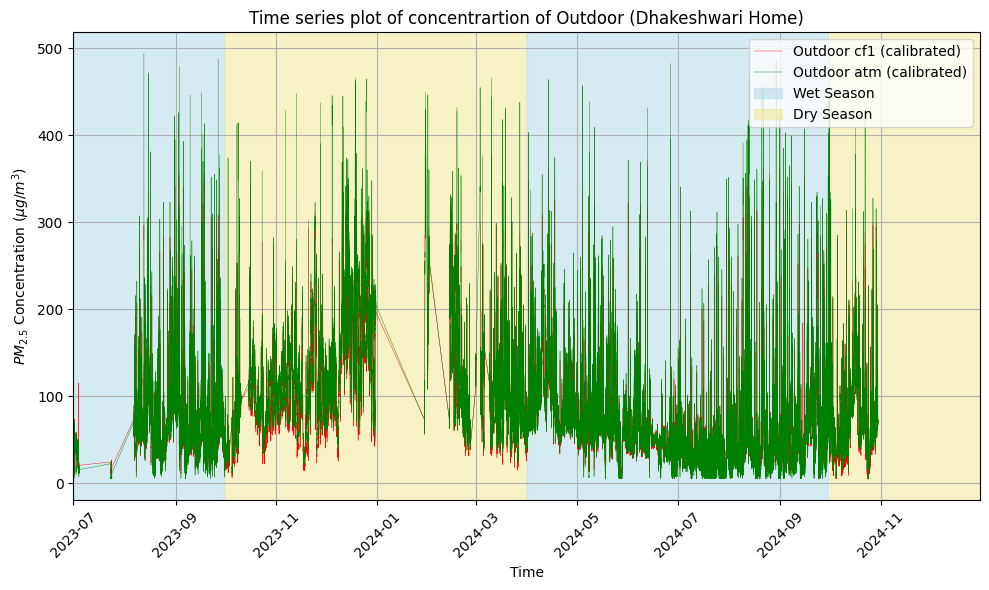

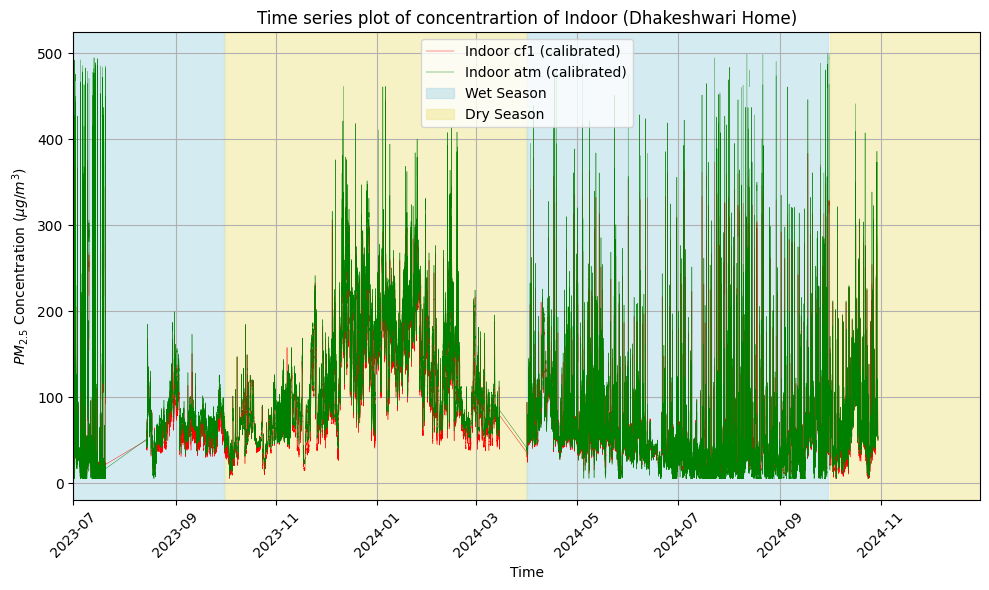

Processed Mohakhali Home


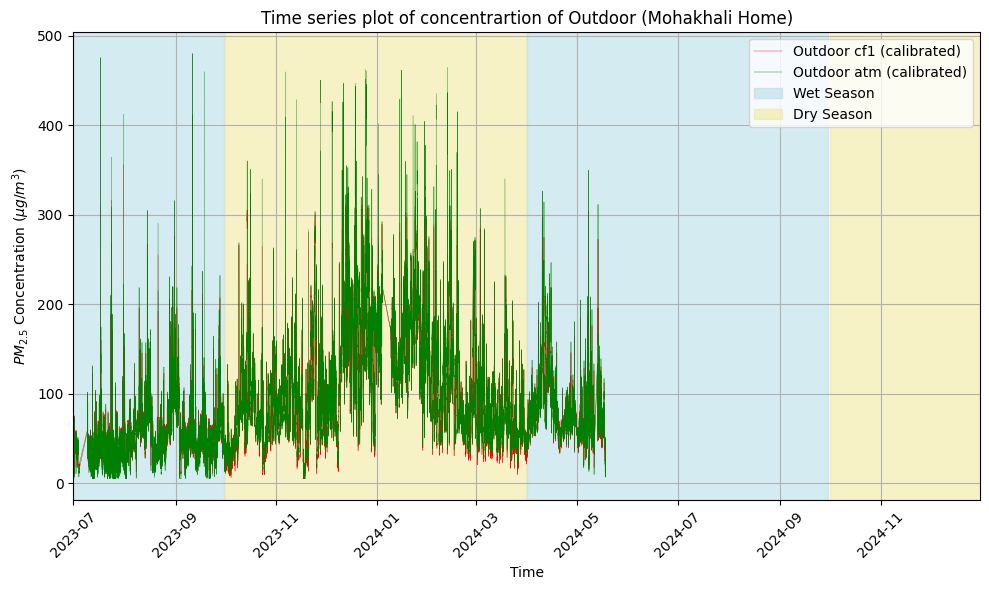

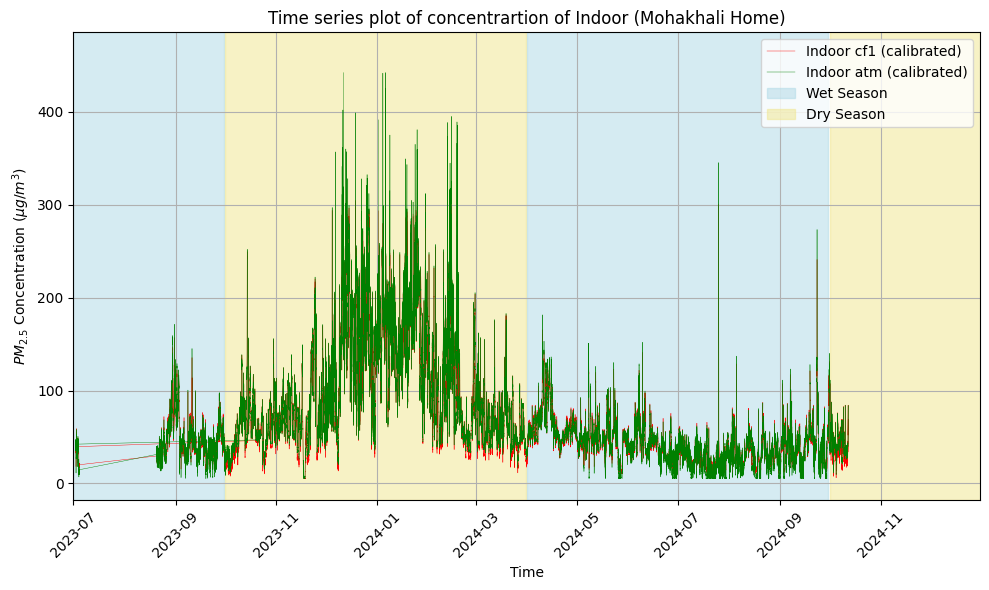

Processed Mohammadpur Home


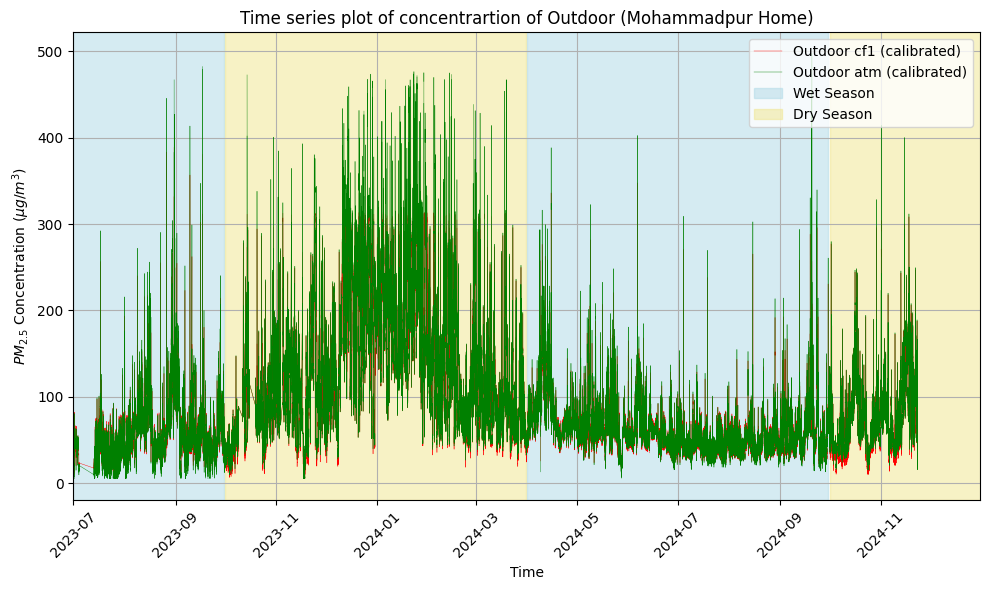

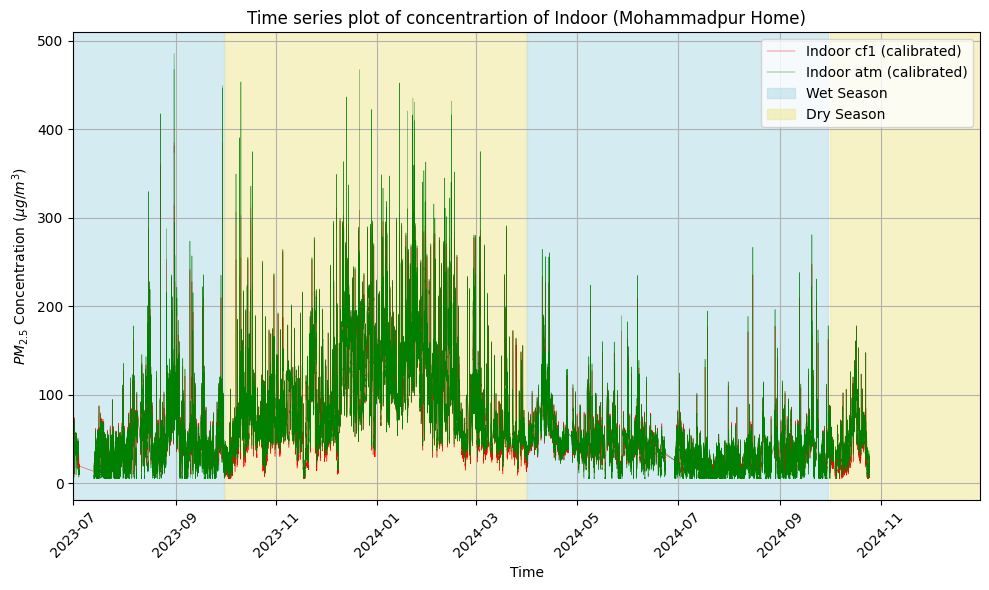

Processed Ajimpur Home


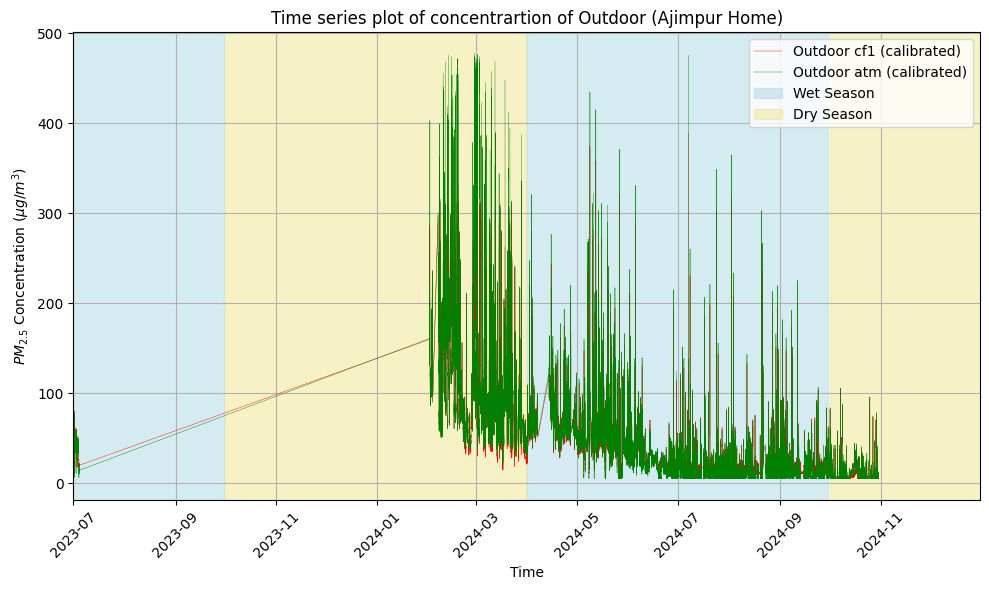

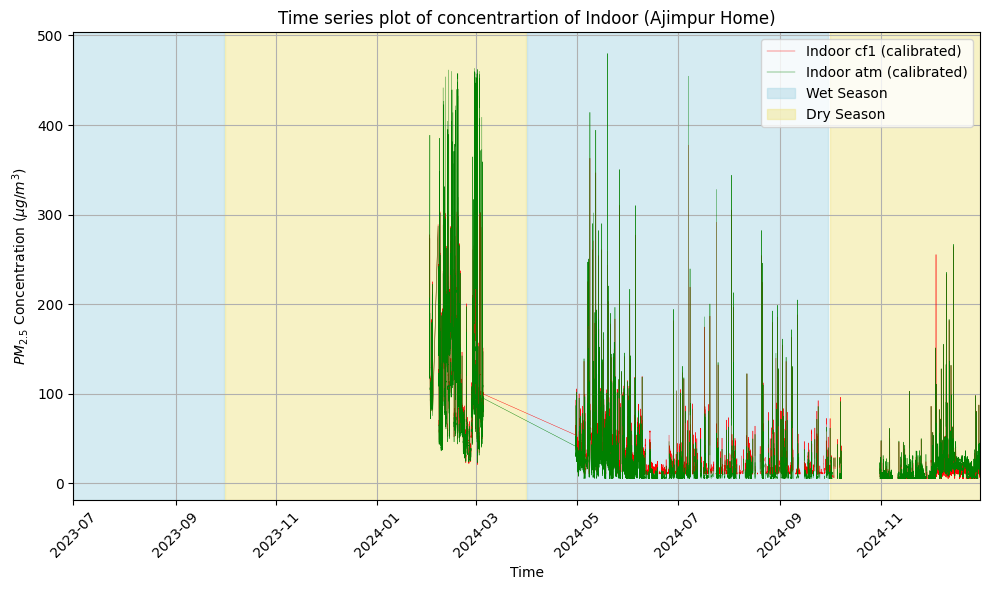

Processed Badda Home


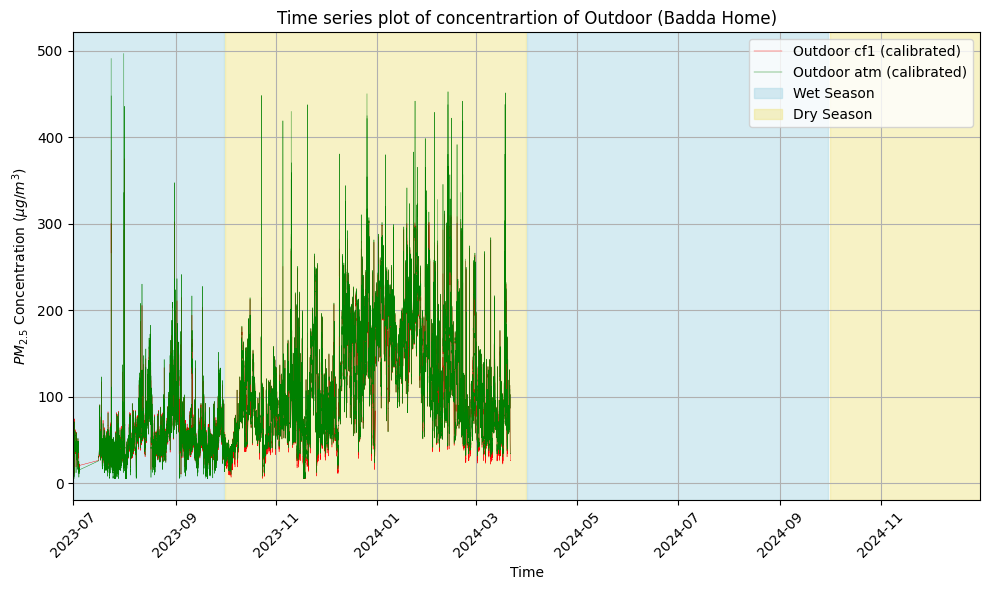

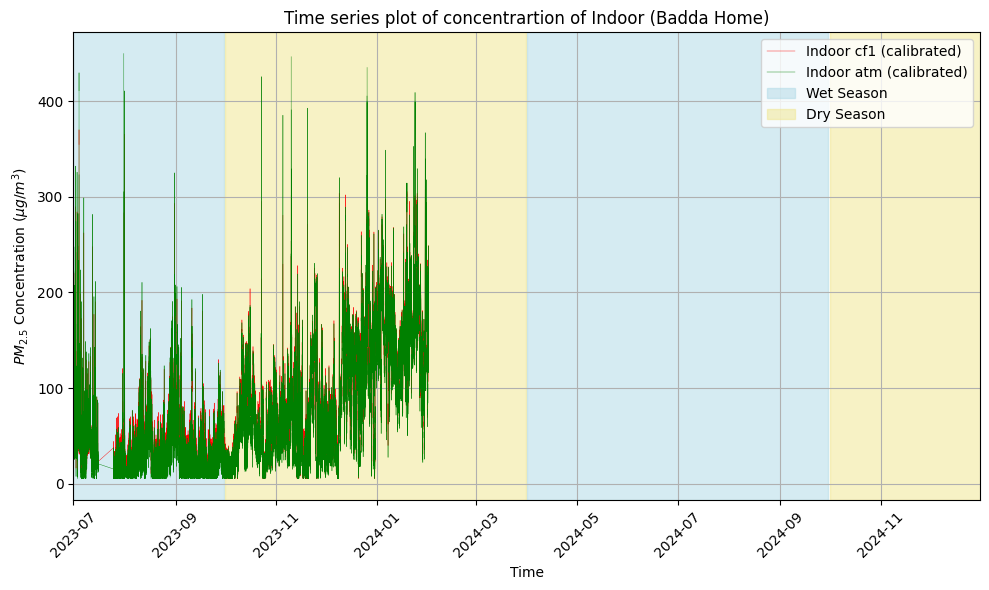

Processed Banasree Home


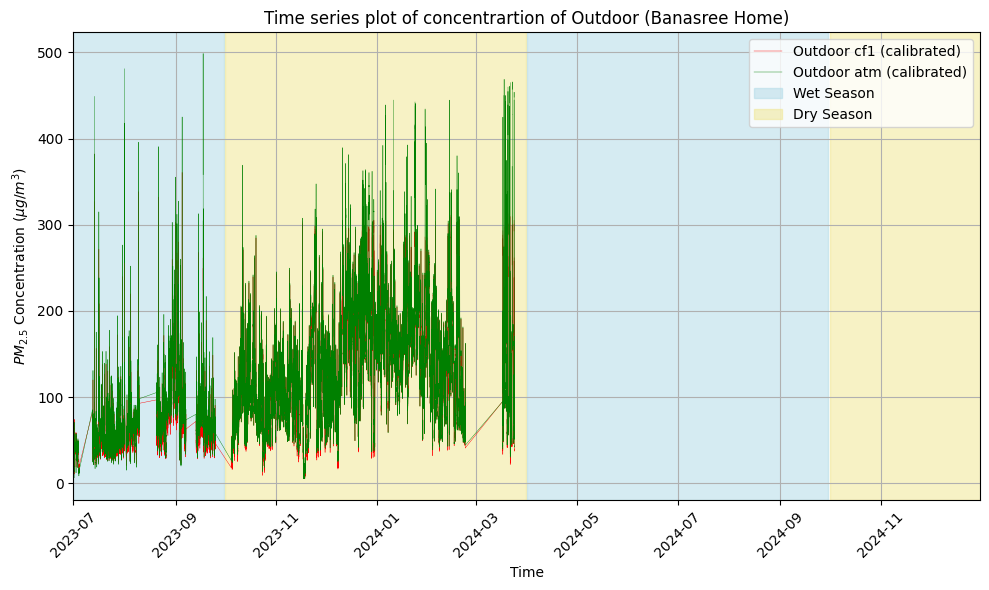

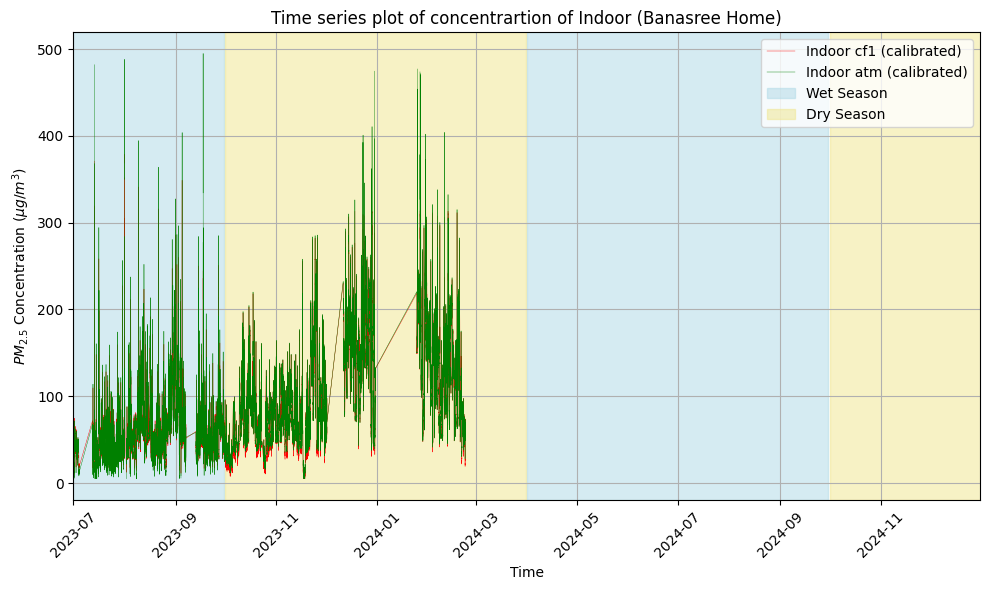

Processed Dania Home


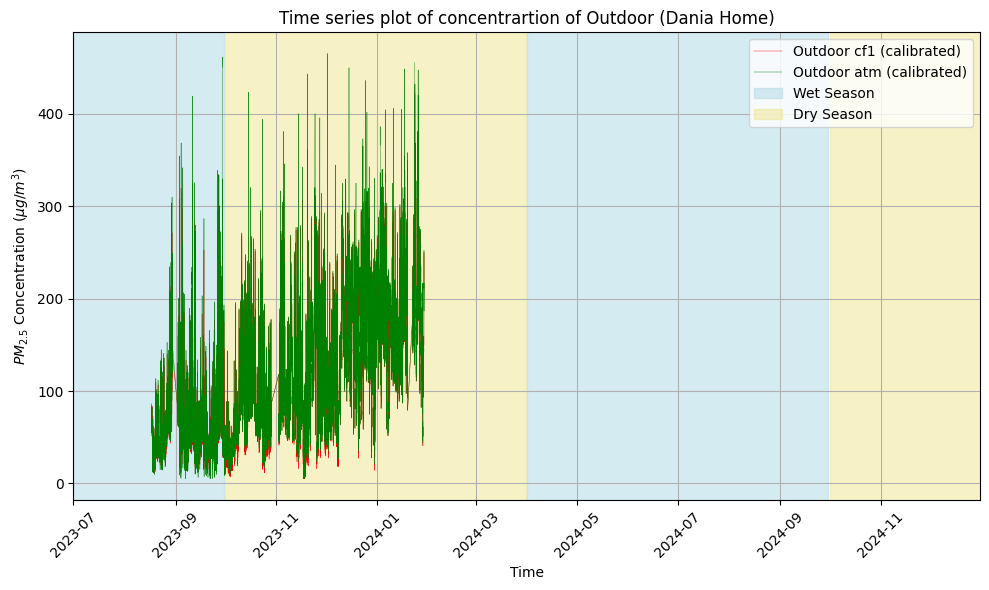

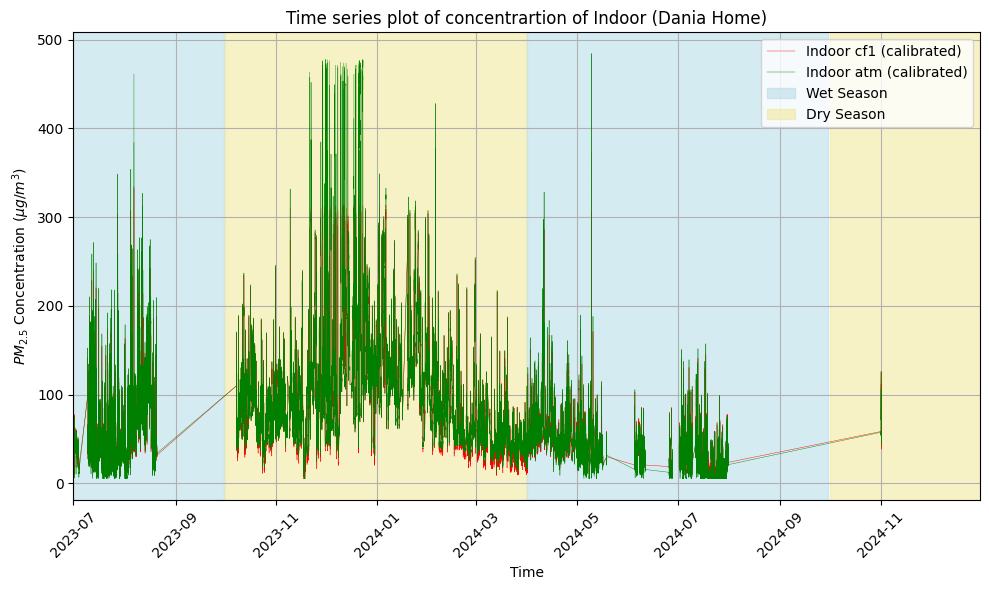

Processed Khilgawn Home


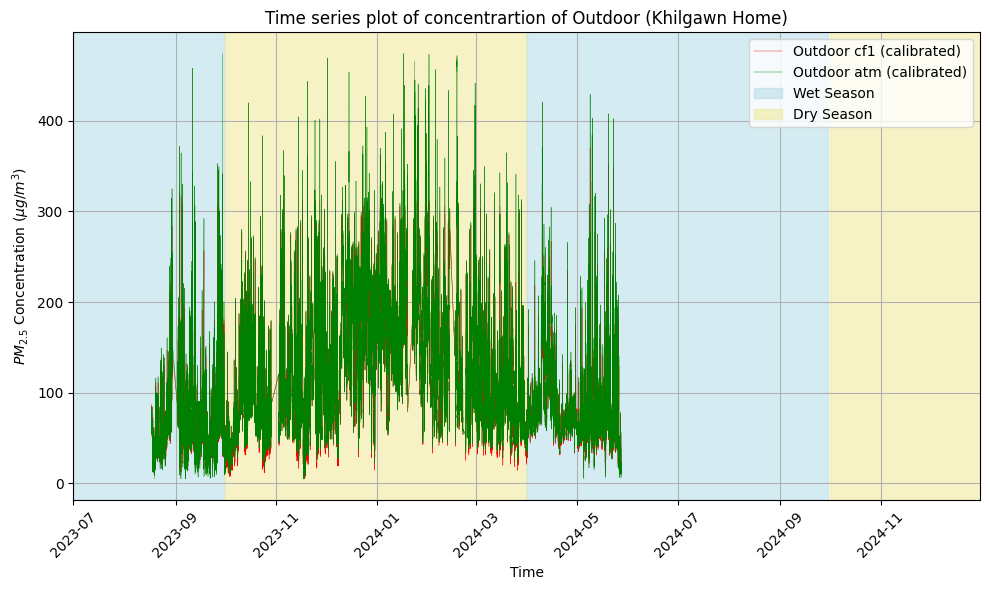

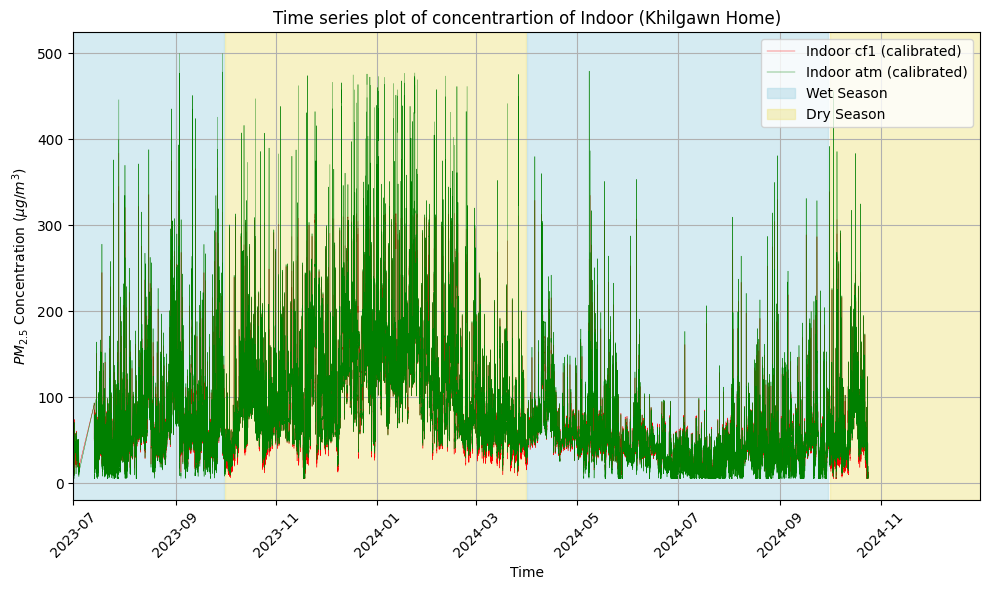

Processed Nakhalpara Home


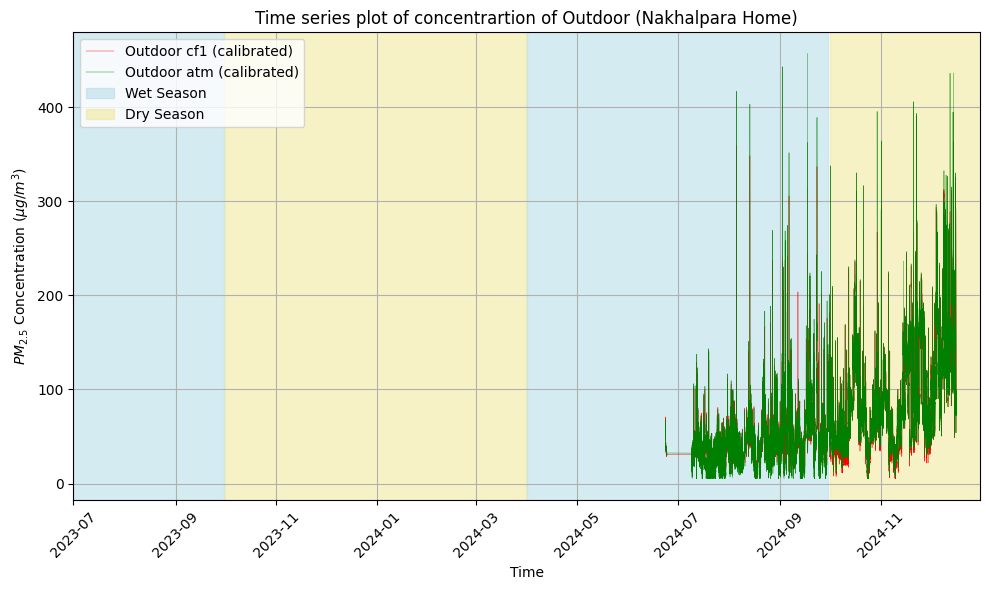

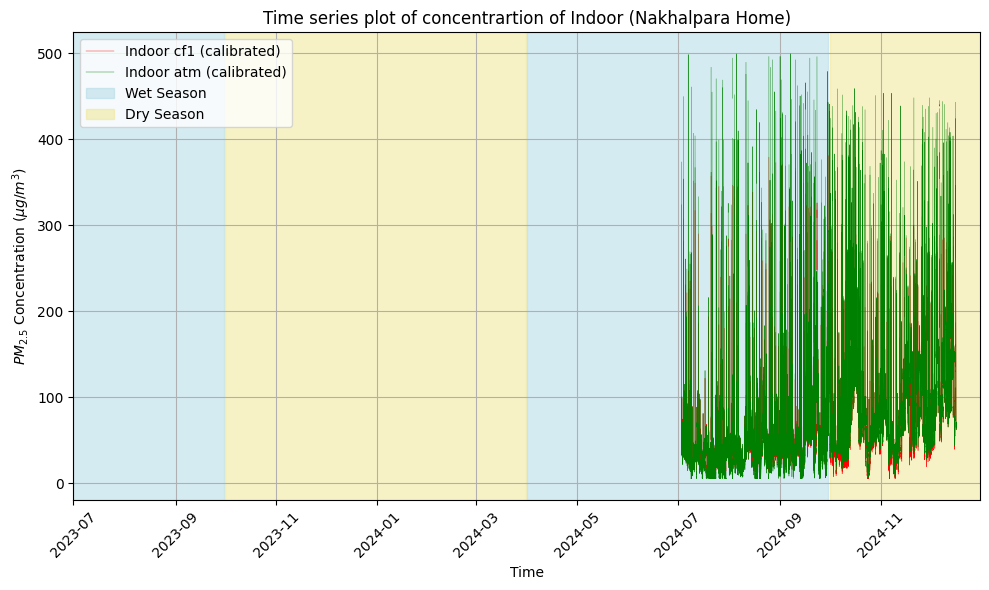

In [ ]:
## Plotting (40 plots)

## plotting

dir = 'Data/Raw Clone'

subdirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d)) if "Home" in d]

for home in tqdm(subdirs, desc="Processing homes"):

    indoor_df = pd.read_csv(f'Data/Raw Clone/{home}/Indoor_merged_after_combined_calibrated.csv')
    indoor_df['BDDateTime'] = pd.to_datetime(indoor_df['BDDateTime'])
    outdoor_df = pd.read_csv(f'Data/Raw Clone/{home}/Outdoor_merged_after_combined_calibrated.csv')
    outdoor_df['BDDateTime'] = pd.to_datetime(outdoor_df['BDDateTime'])
    print(f"Processed {home}")

    def singleFigure(time, data1, data2, home, label, color = None, save = False):
        plt.figure(figsize=(10, 6))

        # Plot the PM2.5 concentrations
        plt.plot(time, data1, label=label[0], color='red', linestyle='-', markersize=3, linewidth = .3)
        plt.plot(time, data2, label=label[1], color='green', linestyle='-', markersize=3, linewidth = .3)

        # Define the background shading for wet and dry seasons
        start_date = 2023
        end_date =  2025

        for year in range(start_date, end_date):
            plt.axvspan(pd.Timestamp(f'{year}-04-01'), pd.Timestamp(f'{year}-09-30'), color='lightblue', alpha=0.5, label='Wet Season' if year == start_date else '')  # Wet season
            plt.axvspan(pd.Timestamp(f'{year}-10-01'), pd.Timestamp(f'{year+1}-03-31'), color='khaki', alpha=0.5, label='Dry Season' if year == start_date else '')  # Dry season

        # Labels and title
        plt.xlabel('Time')
        plt.ylabel(r'$PM_{2.5}$ Concentration ($\mu g/m^3$)')
        plt.title(f'Time series plot of concentrartion of {label[0].split(' ')[0]} ({home})')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)  # Rotate time labels for better visibility
        plt.tight_layout()
        
        plt.xlim(
            pd.to_datetime("2023-07-01"),
            pd.to_datetime("2024-12-31")
        )
        if save: plt.savefig(os.path.join("time series" ,f"{home}_{label}.png"), dpi = 300)
        plt.show()

    singleFigure(outdoor_df['BDDateTime'], outdoor_df['pm2_5_cf_1_calibrated'], outdoor_df['pm2_5_atm_calibrated'], home, ['Outdoor cf1 (calibrated)', "Outdoor atm (calibrated)"], "green", True)
    singleFigure(indoor_df['BDDateTime'], indoor_df['pm2_5_cf_1_calibrated'], indoor_df['pm2_5_atm_calibrated'], home, ['Indoor cf1 (calibrated)', 'Indoor atm (calibrated)'], "blue", True)


#### Hourly average

In [ ]:
def hourly_averages(df, datas, time='UTCDateTime', calibrate = False, subdir = None, merge = None):
    results = {"time" : []}
    for col in datas:
        results[col] = []
        results[col+"count"] = []
    

    # Ensure the DataFrame has the correct time and data columns
    df = df[datas + [time]].copy()
    # df = df.dropna()  # Remove rows with NaN in time or data columns
    df[time] = pd.to_datetime(df[time])  # Ensure time column is datetime
    df = df.sort_values(by=time)  # Sort by time column

    # Generate specific hourly times for calculation (00:30, 01:30, ..., 23:30)
    start_time = df[time].min().replace(minute=30, second=0, microsecond=0)
    end_time = df[time].max().replace(minute=30, second=0, microsecond=0)
    hourly_times = pd.date_range(start=start_time, end=end_time, freq="1h")

    for target_time in tqdm(hourly_times, desc=f"Taking hourly averages for {subdir} ({merge})"):
        # Append the results
        results["time"].append(target_time)
        # Define the 1-hour window (30 minutes before and after)
        start_window = target_time - pd.Timedelta(minutes=30)
        end_window = target_time + pd.Timedelta(minutes=30)
        # Filter data within the window
        window_data_all = df[(df[time] >= start_window) & (df[time] <= end_window)][datas]
        for data in datas:
            # Count the number of data points in the window
            window_data = window_data_all[data].dropna()
            count = len(window_data)
            # Compute the average if the number of points is >= 10
            if count >= 10:
                if calibrate: ## by default it sends non calibrated data. The data can be calibrated afterwards
                    avg = 0.97 * window_data.mean() + 6.3
                else:
                    avg = window_data.mean()
                if data in ['pm2_5_atm_avg', 'pm2_5_cf_1_avg'] and avg > 500:  ### 500 is ommited here
                    avg = np.nan
                
            else:
                avg = np.nan  # Fill with NaN if insufficient data
            
            results[data].append(avg)
            results[data+'count'].append(count)

    # Convert results to a DataFrame for convenience
    results_df = pd.DataFrame(results)
    return results_df

In [ ]:
# Hourly average
dir = "Data/Raw Clone"
subdirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d)) if "Home" in d]
for subdir in tqdm(subdirs, desc="Processing homes"):
    print('='*50)
    print(f"Processing {subdir}")
    merges = ['Indoor_merged_after_combined_calibrated.csv', 'Outdoor_merged_after_combined_calibrated.csv']
    for file in merges:
        if 'ndoor' in file:
            type = 'Indoor'
        elif 'tdoor' in file:
            type = 'Outdoor'
        else:
            warnings.warn("type cannot be detected", UserWarning)
        if False and os.path.exists(os.path.join(dir, subdir, f'Hourly_average_{type}.csv')):
            print("file found. skipping")
            continue
        
        df = pd.read_csv(os.path.join(dir, subdir, file))
        df['BDDateTime'] = pd.to_datetime(df['BDDateTime'])
        hourly_avg = hourly_averages(df, datas=['current_humidity','current_temp_f','current_dewpoint_f','pressure','pm2_5_cf_1','pm2_5_atm','pm2_5_cf_1_b','pm2_5_atm_b','pm2_5_atm_comb','pm2_5_cf_1_comb','pm2_5_cf_1_calibrated','pm2_5_atm_calibrated'], time='BDDateTime', subdir = subdir)
        hourly_avg.to_csv(os.path.join(dir, subdir, f'Hourly_average_merged_calibrated_{type}.csv'), index=False)
        print(f"saved : Hourly_average_merged_calibrated_{type}.csv")

In [ ]:
# Copying
dir = "Data/Raw Clone"
target = 'Data/merged_after_combined_calibrated'
subdirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d)) if "Home" in d]
for subdir in tqdm(subdirs, desc="Processing homes"):
    print('='*50)
    print(f"Processing {subdir}")
    merges = ['Indoor_merged_after_combined_calibrated.csv', 'Outdoor_merged_after_combined_calibrated.csv']
    for file in merges:
        filedir = os.path.join(dir,subdir,file)
        targetdir = os.path.join(target, f"{subdir.split(' ')[0]} {file.split('_')[0]}.csv")
        shutil.copy(filedir, targetdir)

Processing homes:   0%|          | 0/9 [00:00<?, ?it/s]

Processing Dhakeshwari Home
Processing Mohakhali Home
Processing Mohammadpur Home
Processing Ajimpur Home
Processing Badda Home
Processing Banasree Home
Processing Dania Home
Processing Khilgawn Home
Processing Nakhalpara Home


In [ ]:
# Copying
dir = "Data/Raw Clone"
target = 'Data/Hourly Averages'
subdirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d)) if "Home" in d]
for subdir in tqdm(subdirs, desc="Processing homes"):
    print('='*50)
    print(f"Processing {subdir}")
    merges = ['Hourly_average_merged_calibrated_Outdoor.csv', 'Hourly_average_merged_calibrated_Indoor.csv']
    for file in merges:
        filedir = os.path.join(dir,subdir,file)
        targetdir = os.path.join(target, f"{subdir.split(' ')[0]} {file.split('_')[-1]}")
        shutil.copy(filedir, targetdir)

Processing homes:   0%|          | 0/9 [00:00<?, ?it/s]

Processing Dhakeshwari Home
Processing Mohakhali Home
Processing Mohammadpur Home
Processing Ajimpur Home
Processing Badda Home
Processing Banasree Home
Processing Dania Home
Processing Khilgawn Home
Processing Nakhalpara Home


#### Daily Average

In [1]:
def daily_averages(df, datas, time='time', calibrate = False, subdir = None, merge = None):
    results = {"time" : []}
    for col in datas:
        results[col] = []
        results[col+"count"] = []
    

    # Ensure the DataFrame has the correct time and data columns
    df = df[datas + [time]].copy()
    # df = df.dropna()  # Remove rows with NaN in time or data columns
    df[time] = pd.to_datetime(df[time])  # Ensure time column is datetime
    df = df.sort_values(by=time)  # Sort by time column

    # Generate specific hourly times for calculation (00:30, 01:30, ..., 23:30)
    start_time = df[time].min().replace(hour = 12, minute=00, second=0, microsecond=0)
    end_time = df[time].max().replace(hour = 12, minute=0, second=0, microsecond=0)
    days = pd.date_range(start=start_time, end=end_time, freq="D")

    for target_time in tqdm(days, desc=f"Taking daily averages for {subdir} ({merge})"):
        # Append the results
        results["time"].append(target_time)
        # Define the 1-hour window (30 minutes before and after)
        start_window = target_time - pd.Timedelta(hours=12)
        end_window = target_time + pd.Timedelta(hours=12)
        # Filter data within the window
        window_data_all = df[(df[time] >= start_window) & (df[time] <= end_window)][datas]
        for data in datas:
            # Count the number of data points in the window
            window_data = window_data_all[data].dropna()
            count = len(window_data)
            # Compute the average if the number of points is >= 10
            if count >= 20:
                if calibrate: ## by default it sends non calibrated data. The data can be calibrated afterwards
                    avg = 0.97 * window_data.mean() + 6.3
                else:
                    avg = window_data.mean()
                # if data in ['pm2_5_atm_avg', 'pm2_5_cf_1_avg'] and avg > 500:  ### 500 is ommited here
                #     avg = np.nan
                
            else:
                avg = np.nan  # Fill with NaN if insufficient data
            
            results[data].append(avg)
            results[data+'count'].append(count)

    # Convert results to a DataFrame for convenience
    results_df = pd.DataFrame(results)
    return results_df

In [5]:
# Daily average
dir = "Data/Raw Clone"
subdirs = [d for d in os.listdir(dir) if os.path.isdir(os.path.join(dir, d)) if "Home" in d]
for subdir in tqdm(subdirs, desc="Processing homes"):
    print('='*50)
    print(f"Processing {subdir}")
    merges = ['Hourly_average_merged_calibrated_Outdoor.csv', 'Hourly_average_merged_calibrated_Indoor.csv']
    for file in merges:
        if 'ndoor' in file:
            type = 'Indoor'
        elif 'tdoor' in file:
            type = 'Outdoor'
        else:
            warnings.warn("type cannot be detected", UserWarning)
        if False and os.path.exists(os.path.join(dir, subdir, f'Hourly_average_{type}.csv')):
            print("file found. skipping")
            continue
        
        df = pd.read_csv(os.path.join(dir, subdir, file))
        df['time'] = pd.to_datetime(df['time'])
        daily_avg = daily_averages(df, datas=['current_humidity','current_temp_f','current_dewpoint_f','pressure','pm2_5_cf_1','pm2_5_atm','pm2_5_cf_1_b','pm2_5_atm_b','pm2_5_atm_comb','pm2_5_cf_1_comb','pm2_5_cf_1_calibrated','pm2_5_atm_calibrated'], time='time', subdir = subdir)
        daily_avg.to_csv(os.path.join(dir, subdir, f'Daily_average_merged_calibrated_{type}.csv'), index=False)
        # daily_avg.info()
        print(f"saved : Daily_average_merged_calibrated_{type}.csv")

Processing homes:   0%|          | 0/9 [00:00<?, ?it/s]

Processing Dhakeshwari Home


Taking daily averages for Dhakeshwari Home (None):   0%|          | 0/488 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Outdoor.csv


Taking daily averages for Dhakeshwari Home (None):   0%|          | 0/488 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Indoor.csv
Processing Mohakhali Home


Taking daily averages for Mohakhali Home (None):   0%|          | 0/323 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Outdoor.csv


Taking daily averages for Mohakhali Home (None):   0%|          | 0/469 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Indoor.csv
Processing Mohammadpur Home


Taking daily averages for Mohammadpur Home (None):   0%|          | 0/512 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Outdoor.csv


Taking daily averages for Mohammadpur Home (None):   0%|          | 0/483 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Indoor.csv
Processing Ajimpur Home


Taking daily averages for Ajimpur Home (None):   0%|          | 0/488 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Outdoor.csv


Taking daily averages for Ajimpur Home (None):   0%|          | 0/352 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Indoor.csv
Processing Badda Home


Taking daily averages for Badda Home (None):   0%|          | 0/265 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Outdoor.csv


Taking daily averages for Badda Home (None):   0%|          | 0/216 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Indoor.csv
Processing Banasree Home


Taking daily averages for Banasree Home (None):   0%|          | 0/268 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Outdoor.csv


Taking daily averages for Banasree Home (None):   0%|          | 0/238 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Indoor.csv
Processing Dania Home


Taking daily averages for Dania Home (None):   0%|          | 0/166 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Outdoor.csv


Taking daily averages for Dania Home (None):   0%|          | 0/490 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Indoor.csv
Processing Khilgawn Home


Taking daily averages for Khilgawn Home (None):   0%|          | 0/435 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Outdoor.csv


Taking daily averages for Khilgawn Home (None):   0%|          | 0/482 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Indoor.csv
Processing Nakhalpara Home


Taking daily averages for Nakhalpara Home (None):   0%|          | 0/177 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Outdoor.csv


Taking daily averages for Nakhalpara Home (None):   0%|          | 0/167 [00:00<?, ?it/s]

saved : Daily_average_merged_calibrated_Indoor.csv
